# (12) Reservoir + GLM
**Motivation**: <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-MTMST/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-MTMST/figs')
tmp_dir = os.path.join(git_dir, 'jb-MTMST/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_MTMST'))
from vae.train_vae import TrainerVAE, ConfigTrainVAE
from vae.vae2d import VAE, ConfigVAE
from analysis.opticflow import *
from figures.fighelper import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
mp = torch.nn.AdaptiveMaxPool2d(1)

In [3]:
x = torch.randn((13, 128, 4, 4))
y = mp(x)

In [4]:
y.size()

torch.Size([13, 128, 1, 1])

In [61]:
a = 1e-5
f"{a:0.2g}"

'1e-05'

## Create reservoir

In [2]:
vae = VAE(ConfigVAE('fixate1', ker_sz=4, input_sz=19))
tr = TrainerVAE(vae, ConfigTrainVAE(batch_size=500), device='cuda')
vae.print()
print(vae.cfg.name())
vae.scales, vae.cfg.total_latents()

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
|     VAE      |  17.0 Mil  |
|     ---      |    ---     |
|     stem     |   1.1 K    |
| pre_process  |   96.0 K   |
|  enc_tower   |  9.4 Mil   |
|     enc0     |   16.6 K   |
| enc_sampler  |  1.4 Mil   |
| dec_sampler  |  1.4 Mil   |
|    expand    |   71.0 K   |
|  dec_tower   |  4.5 Mil   |
| post_process |   40.0 K   |
|     out      |    578     |
+--------------+------------+

fixate1_k-32_z-7x[10,20]_enc(2x2)-dec(2x1)-pre(1x3)-post(1x3)

([8, 4], 210)

## ReadoutGLM

In [3]:
from analysis.glm import ReadoutGLM, setup_data
from analysis.linear import LinearModel

### Loop

doing: clu036

[PROGRESS] neural data loaded

100%|███████████████████████████████████████████| 58/58 [00:21<00:00,  2.68it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 10896/10896 [00:17<00:00, 613.68it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

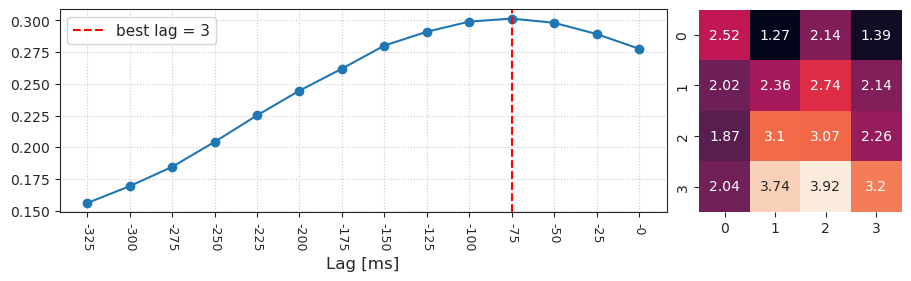

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.109906 -0.021009
0.0010   0.110055 -0.020764
0.0100   0.130701  0.016937
0.1000   0.143038  0.032670
1.0000   0.144765  0.031335
10.0000  0.139766  0.024072

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.117331 -0.037049
0.0010   0.114665 -0.030390
0.0100   0.125874  0.003896
0.1000   0.140100  0.030438
1.0000   0.159904  0.035951
10.0000  0.160511  0.028727

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                      
0.0001   0.118794 -0.002829
0.0010   0.122832  0.009605
0.0100   0.129790  0.025578
0.1000   0.143215  0.032642
1.0000   0.154153  0.028194
10.0000  0.126767  0.015004

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.110967 -0.020461
0.0010   0.109754 -0.017853
0.0100   0.121665  0.006013
0.1000   0.150659  0.037202
1.0000   0.176803  0.041880
10.0000  0.177739  0.033038

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.143121 -0.011134
0.0010   0.142975  0.005170
0.0100   0.150393  0.024970
0.1000   0.163139  0.044018
1.0000   0.182349  0.045496
10.0000  0.173642  0.032526

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.139670 -0.000403
0.0010   0.134354 -0.008662
0.0100   0.149168  0.024300
0.1000   0.163619  0.045174
1.0000   0.189028  0.049052
10.0000  0.194573  0.036268

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                      
0.0001   0.111707 -0.033093
0.0010   0.116716 -0.024353
0.0100   0.135217  0.019016
0.1000   0.149621  0.034538
1.0000   0.159195  0.033432
10.0000  0.142560  0.017994

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu036, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                      
0.0001   0.113058 -0.013219
0.0010   0.113798 -0.014865
0.0100   0.130587  0.013882
0.1000   0.151433  0.037120
1.0000   0.173966  0.041652
10.0000  0.181037  0.033232

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 10.00000, best_r = 0.195

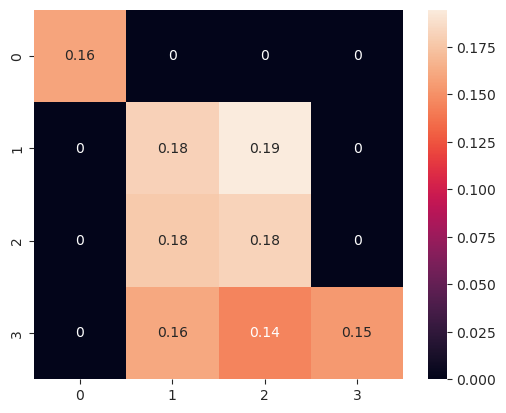

done: clu036

doing: clu037

[PROGRESS] neural data loaded

100%|███████████████████████████████████████████| 58/58 [00:19<00:00,  2.96it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 10847/10847 [00:17<00:00, 622.50it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

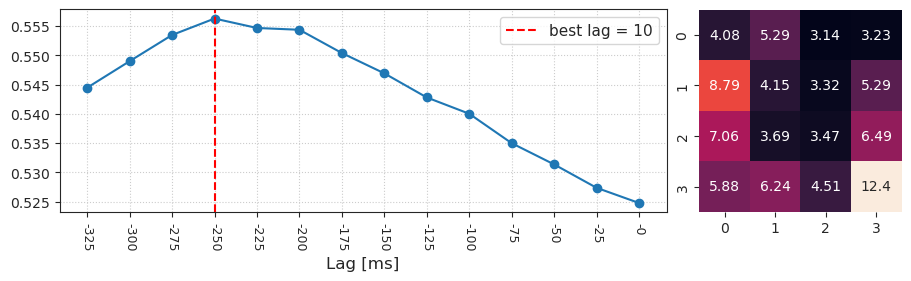

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                      
0.0001   0.247107  0.067403
0.0010   0.251232  0.118689
0.0100   0.260299  0.172893
0.1000   0.268686  0.180647
1.0000   0.239781  0.130233
10.0000  0.142059  0.050045

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                      
0.0001   0.253679  0.095580
0.0010   0.255849  0.133340
0.0100   0.263207  0.160352
0.1000   0.250804  0.169238
1.0000   0.213175  0.118713
10.0000  0.168195  0.061294

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                      
0.0001   0.246225  0.079017
0.0010   0.248648  0.079470
0.0100   0.262539  0.145466
0.1000   0.257780  0.160632
1.0000   0.205500  0.093998
10.0000  0.135658  0.039896

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.232563  0.095191
0.0010   0.240036  0.112921
0.0100   0.257558  0.163456
0.1000   0.265059  0.173308
1.0000   0.247612  0.137240
10.0000  0.205479  0.065061

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.242233  0.109684
0.0010   0.255456  0.126105
0.0100   0.271536  0.163815
0.1000   0.253075  0.147725
1.0000   0.181357  0.078565
10.0000  0.133591  0.032394

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                      
0.0001   0.235225  0.105159
0.0010   0.232448  0.115242
0.0100   0.232016  0.135073
0.1000   0.194303  0.094331
1.0000   0.149732  0.048572
10.0000  0.099870  0.019576

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.259407  0.159547
0.0010   0.261635  0.170170
0.0100   0.271484  0.194868
0.1000   0.260096  0.170108
1.0000   0.217006  0.106111
10.0000  0.150885  0.040229

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu037, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.259717  0.151475
0.0010   0.264274  0.177106
0.0100   0.268383  0.193825
0.1000   0.252359  0.177441
1.0000   0.209986  0.113917
10.0000  0.140888  0.041655

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.272

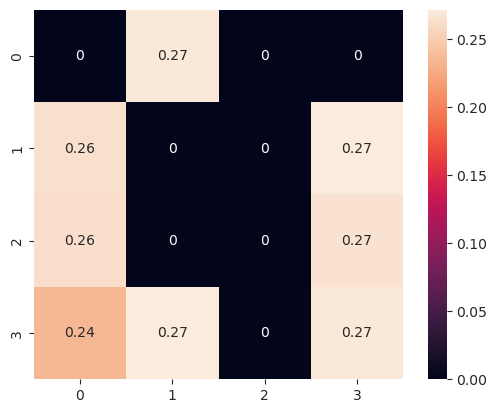

done: clu037

doing: clu038

[PROGRESS] neural data loaded

100%|███████████████████████████████████████████| 58/58 [00:19<00:00,  2.95it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 22441/22441 [00:36<00:00, 620.47it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

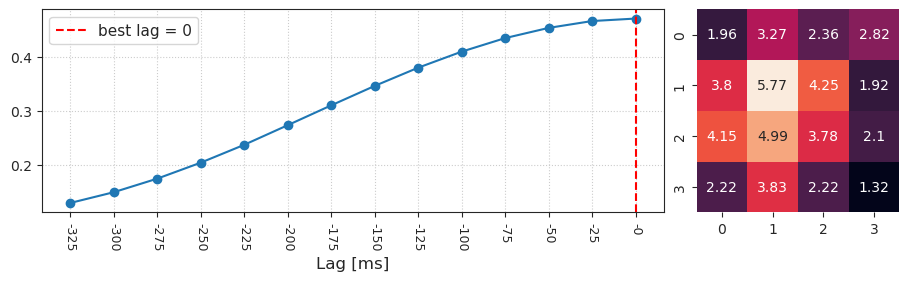

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                      
0.0001   0.314270  0.047190
0.0010   0.318705  0.050215
0.0100   0.317305  0.048820
0.1000   0.321976  0.052794
1.0000   0.309263  0.049461
10.0000  0.275742  0.037891

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.329817  0.055759
0.0010   0.331487  0.057232
0.0100   0.333517  0.057670
0.1000   0.332531  0.057737
1.0000   0.316973  0.051695
10.0000  0.285177  0.039781

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.327385  0.054862
0.0010   0.327916  0.054589
0.0100   0.327755  0.054369
0.1000   0.329187  0.056382
1.0000   0.312760  0.049996
10.0000  0.271741  0.035541

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                      
0.0001   0.323440  0.050770
0.0010   0.325900  0.052519
0.0100   0.326835  0.053494
0.1000   0.324641  0.054143
1.0000   0.302774  0.047027
10.0000  0.270998  0.036931

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.321033  0.051513
0.0010   0.321945  0.051755
0.0100   0.323327  0.053133
0.1000   0.324590  0.053927
1.0000   0.302311  0.045576
10.0000  0.254509  0.031150

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                      
0.0001   0.323772  0.054710
0.0010   0.322200  0.054549
0.0100   0.325240  0.055881
0.1000   0.323085  0.055352
1.0000   0.306728  0.049117
10.0000  0.277949  0.039076

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.325476  0.054007
0.0010   0.324540  0.052964
0.0100   0.328288  0.054755
0.1000   0.327583  0.055483
1.0000   0.311201  0.049389
10.0000  0.271907  0.036237

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu038, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.324626  0.053129
0.0010   0.324161  0.052528
0.0100   0.327668  0.054019
0.1000   0.324544  0.054262
1.0000   0.299779  0.046105
10.0000  0.253549  0.032246

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.334

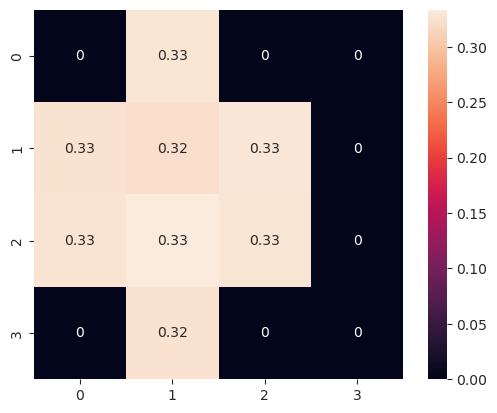

done: clu038

doing: clu039

[PROGRESS] neural data loaded

100%|███████████████████████████████████████████| 77/77 [00:26<00:00,  2.95it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 22779/22779 [00:36<00:00, 630.91it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

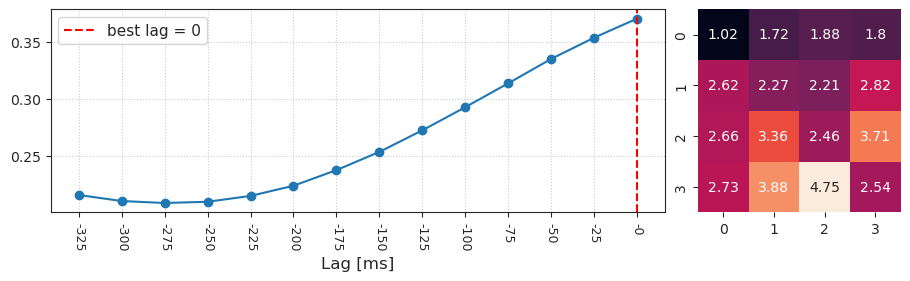

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.349855  0.119156
0.0010   0.351217  0.121191
0.0100   0.355165  0.126267
0.1000   0.348961  0.124461
1.0000   0.311294  0.096837
10.0000  0.259169  0.060399

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.347495  0.117973
0.0010   0.343012  0.116358
0.0100   0.345993  0.118921
0.1000   0.337293  0.113174
1.0000   0.292831  0.083750
10.0000  0.232027  0.049982

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.348620  0.123678
0.0010   0.347820  0.122656
0.0100   0.350468  0.126291
0.1000   0.350773  0.125497
1.0000   0.315388  0.100079
10.0000  0.257937  0.062714

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.370770  0.133190
0.0010   0.369131  0.131430
0.0100   0.371576  0.134569
0.1000   0.370598  0.135379
1.0000   0.350388  0.118589
10.0000  0.300936  0.077795

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.362170  0.128526
0.0010   0.362907  0.129321
0.0100   0.362611  0.130689
0.1000   0.351653  0.122940
1.0000   0.305186  0.091119
10.0000  0.223191  0.049477

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                      
0.0001   0.345756  0.120807
0.0010   0.346318  0.122297
0.0100   0.348285  0.123124
0.1000   0.323496  0.104150
1.0000   0.269980  0.070277
10.0000  0.201641  0.035622

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                      
0.0001   0.336594  0.106768
0.0010   0.332936  0.105611
0.0100   0.339636  0.110559
0.1000   0.340845  0.113306
1.0000   0.298682  0.085325
10.0000  0.221906  0.047838

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu039, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                      
0.0001   0.333709  0.107760
0.0010   0.332876  0.109301
0.0100   0.337407  0.113000
0.1000   0.333481  0.112691
1.0000   0.305268  0.091936
10.0000  0.252739  0.060062

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.372

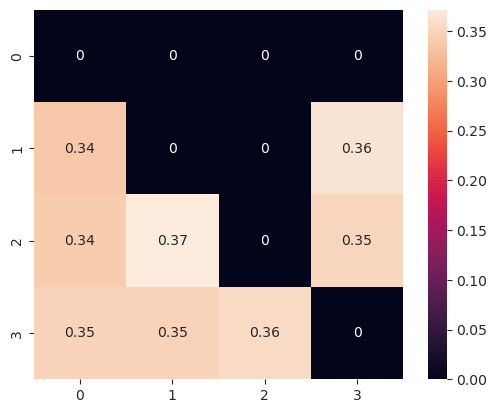

done: clu039

doing: clu040

[PROGRESS] neural data loaded

100%|███████████████████████████████████████████| 77/77 [00:26<00:00,  2.92it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 24689/24689 [00:40<00:00, 604.04it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

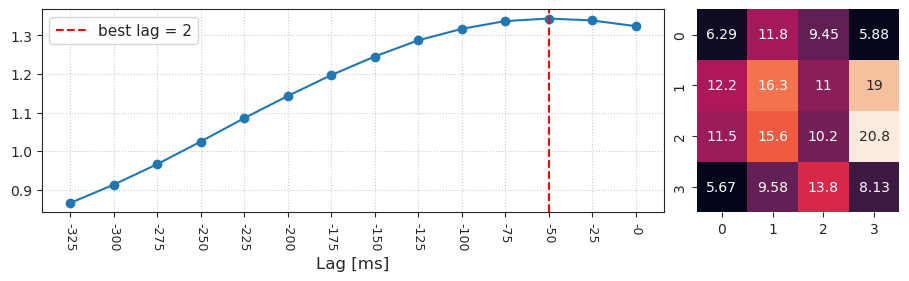

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.463676  0.509418
0.0010   0.462266  0.503536
0.0100   0.465056  0.501037
0.1000   0.428900  0.430992
1.0000   0.356303  0.306623
10.0000  0.270617  0.170109

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.449378  0.483045
0.0010   0.449293  0.484001
0.0100   0.449965  0.475973
0.1000   0.433828  0.418199
1.0000   0.364977  0.290735
10.0000  0.271507  0.154608

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                      
0.0001   0.481073  0.552872
0.0010   0.472608  0.548665
0.0100   0.484415  0.551180
0.1000   0.460546  0.497553
1.0000   0.418724  0.380302
10.0000  0.322787  0.192530

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.465572  0.539536
0.0010   0.470693  0.543962
0.0100   0.477801  0.546502
0.1000   0.465492  0.502380
1.0000   0.417802  0.376974
10.0000  0.320816  0.193294

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.453317  0.501991
0.0010   0.460379  0.505036
0.0100   0.466133  0.508378
0.1000   0.439913  0.431985
1.0000   0.372173  0.303478
10.0000  0.290166  0.173396

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (1, 0)

r      nnll
alpha                      
0.0001   0.421673  0.497867
0.0010   0.411118  0.494233
0.0100   0.446432  0.503272
0.1000   0.432354  0.433708
1.0000   0.359073  0.298101
10.0000  0.263994  0.151349

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.479441  0.533102
0.0010   0.482666  0.536352
0.0100   0.496031  0.543974
0.1000   0.454729  0.458083
1.0000   0.375616  0.307902
10.0000  0.279240  0.153857

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu040, neuron # 0; pix: (i, j) = (2, 0)

r      nnll
alpha                      
0.0001   0.459996  0.502993
0.0010   0.464156  0.507318
0.0100   0.460337  0.499172
0.1000   0.427538  0.424305
1.0000   0.347637  0.290192
10.0000  0.257860  0.140104

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.496

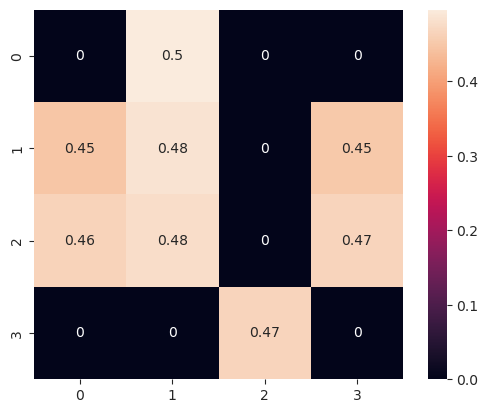

done: clu040

doing: clu043

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:38<00:00,  2.99it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 39258/39258 [01:03<00:00, 620.29it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

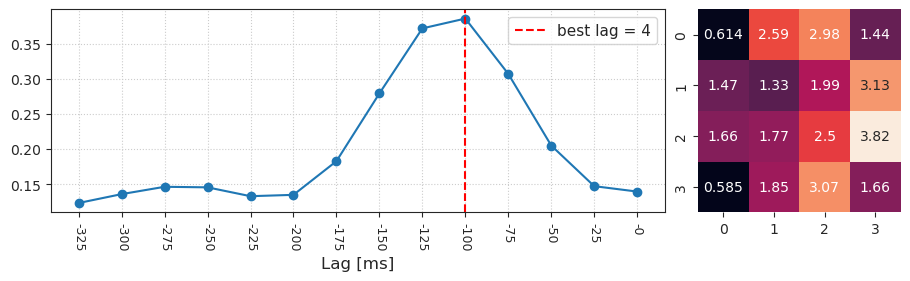

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.363066  0.058501
0.0010   0.365306  0.059001
0.0100   0.365309  0.058852
0.1000   0.359760  0.055737
1.0000   0.332684  0.045887
10.0000  0.288531  0.033407

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.361176  0.057312
0.0010   0.361459  0.057384
0.0100   0.363960  0.057844
0.1000   0.358072  0.054839
1.0000   0.329534  0.044684
10.0000  0.279071  0.031723

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.352027  0.053093
0.0010   0.352892  0.053339
0.0100   0.355487  0.053969
0.1000   0.348578  0.050706
1.0000   0.320434  0.040470
10.0000  0.271536  0.027655

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                      
0.0001   0.371961  0.060849
0.0010   0.371930  0.060896
0.0100   0.372690  0.060953
0.1000   0.366199  0.057053
1.0000   0.331830  0.045349
10.0000  0.283918  0.032774

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.358042  0.056482
0.0010   0.357899  0.056226
0.0100   0.355756  0.055698
0.1000   0.350839  0.053096
1.0000   0.317173  0.042159
10.0000  0.275310  0.030782

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.371237  0.060410
0.0010   0.370495  0.060293
0.0100   0.372569  0.060799
0.1000   0.368879  0.058432
1.0000   0.340152  0.047053
10.0000  0.287342  0.033146

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.371416  0.060906
0.0010   0.372628  0.061222
0.0100   0.374320  0.061666
0.1000   0.374100  0.060734
1.0000   0.348108  0.051111
10.0000  0.297665  0.036256

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu043, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.350878  0.053471
0.0010   0.351851  0.053681
0.0100   0.353605  0.054097
0.1000   0.347326  0.050826
1.0000   0.311759  0.038611
10.0000  0.262450  0.025107

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.374

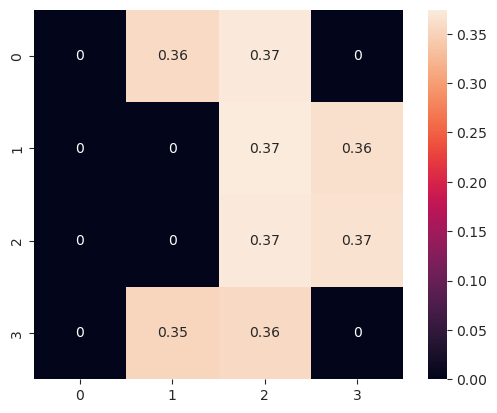

done: clu043

doing: clu044

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 154/154 [00:53<00:00,  2.86it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 62598/62598 [01:42<00:00, 611.33it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

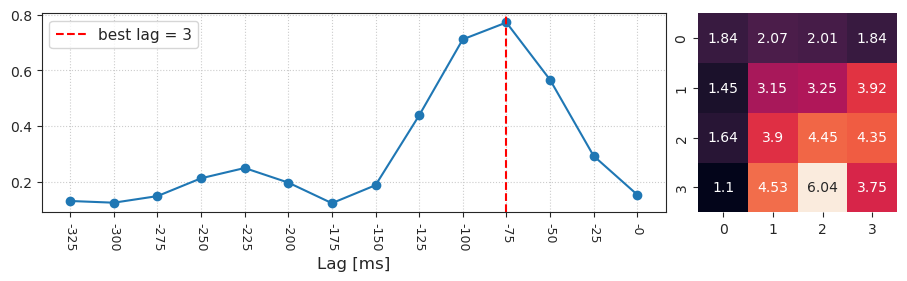

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.339991  0.115519
0.0010   0.340382  0.116034
0.0100   0.344571  0.118099
0.1000   0.341753  0.114077
1.0000   0.316460  0.098585
10.0000  0.276476  0.078205

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.351177  0.120624
0.0010   0.351781  0.120503
0.0100   0.350549  0.120578
0.1000   0.334252  0.111409
1.0000   0.294375  0.089969
10.0000  0.250883  0.064703

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.354564  0.124362
0.0010   0.353227  0.123245
0.0100   0.353674  0.124100
0.1000   0.350020  0.121465
1.0000   0.323472  0.103959
10.0000  0.278989  0.077534

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.352703  0.121569
0.0010   0.353287  0.121888
0.0100   0.355023  0.122843
0.1000   0.348198  0.116939
1.0000   0.315983  0.097578
10.0000  0.265830  0.070817

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.341291  0.111653
0.0010   0.340689  0.112259
0.0100   0.342307  0.113426
0.1000   0.332361  0.107153
1.0000   0.301594  0.088667
10.0000  0.243523  0.060378

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.340811  0.115648
0.0010   0.340730  0.115634
0.0100   0.342537  0.116504
0.1000   0.339914  0.113999
1.0000   0.314252  0.098110
10.0000  0.267356  0.070615

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu044, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.329640  0.109842
0.0010   0.331155  0.110688
0.0100   0.332924  0.112051
0.1000   0.329691  0.109097
1.0000   0.307870  0.093956
10.0000  0.252642  0.064776

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.355

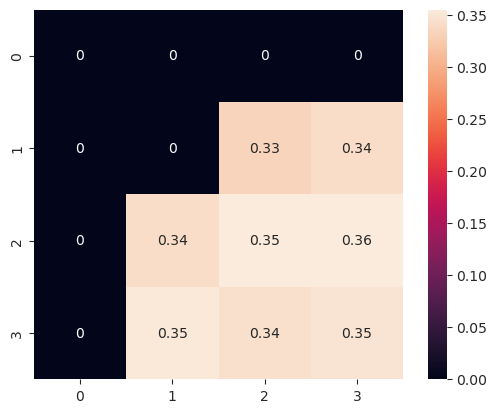

done: clu044

doing: clu053

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:39<00:00,  2.94it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 47543/47543 [01:13<00:00, 648.25it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

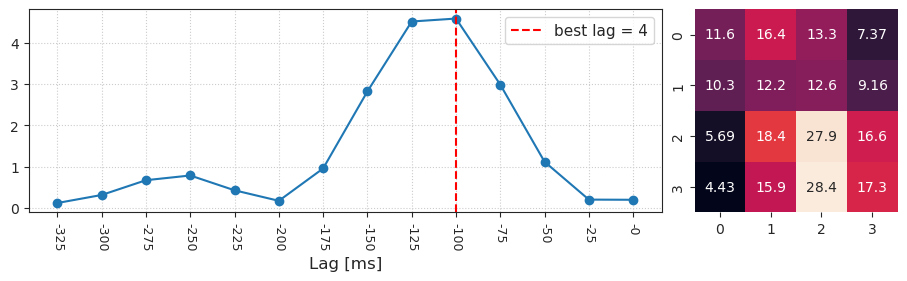

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.457364  0.379398
0.0010   0.453056  0.378648
0.0100   0.465353  0.382808
0.1000   0.468262  0.368846
1.0000   0.445044  0.331007
10.0000  0.386285  0.270511

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.462792  0.388682
0.0010   0.462752  0.387086
0.0100   0.468144  0.390961
0.1000   0.466805  0.380636
1.0000   0.443199  0.346990
10.0000  0.405089  0.297187

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.473961  0.382869
0.0010   0.473847  0.381006
0.0100   0.475048  0.384103
0.1000   0.466710  0.376846
1.0000   0.445300  0.347847
10.0000  0.406180  0.279146

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 3)

r      nnll
alpha                      
0.0001   0.468162  0.375360
0.0010   0.469026  0.375520
0.0100   0.471880  0.374276
0.1000   0.449826  0.341908
1.0000   0.403034  0.285897
10.0000  0.345428  0.208659

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (2, 3)

r      nnll
alpha                      
0.0001   0.456173  0.373501
0.0010   0.457776  0.371987
0.0100   0.459216  0.372138
0.1000   0.445755  0.351651
1.0000   0.403805  0.307480
10.0000  0.353237  0.233517

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.443621  0.361849
0.0010   0.445440  0.362597
0.0100   0.449531  0.364284
0.1000   0.441277  0.346347
1.0000   0.414868  0.292853
10.0000  0.342514  0.192501

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.453653  0.366367
0.0010   0.454940  0.366969
0.0100   0.456635  0.368559
0.1000   0.444742  0.354513
1.0000   0.406550  0.304128
10.0000  0.347204  0.220189

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu053, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                      
0.0001   0.434499  0.357320
0.0010   0.438541  0.361121
0.0100   0.437482  0.360673
0.1000   0.430783  0.343927
1.0000   0.413274  0.295116
10.0000  0.354693  0.199081

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.475

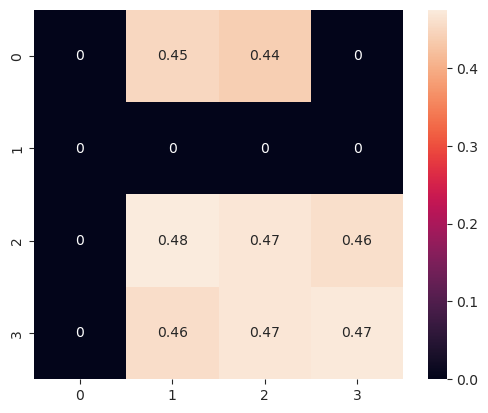

done: clu053

doing: clu055

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:39<00:00,  2.93it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 36178/36178 [00:58<00:00, 615.13it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

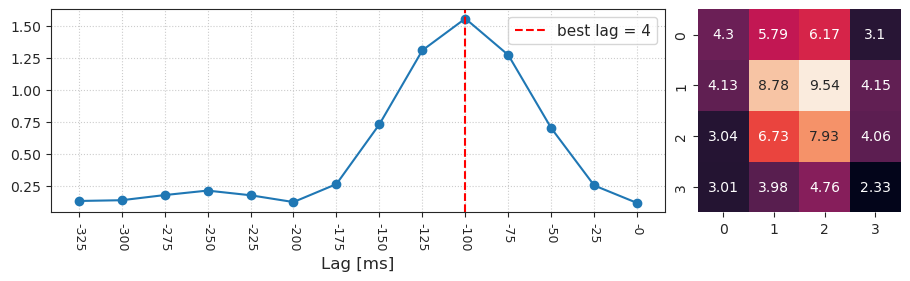

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.385335  0.211979
0.0010   0.384360  0.211407
0.0100   0.388309  0.212895
0.1000   0.384600  0.202633
1.0000   0.363815  0.173187
10.0000  0.322401  0.135669

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                      
0.0001   0.381785  0.200173
0.0010   0.385009  0.201643
0.0100   0.385028  0.204345
0.1000   0.384907  0.199975
1.0000   0.361573  0.168550
10.0000  0.312581  0.125274

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                      
0.0001   0.388899  0.212533
0.0010   0.390475  0.212741
0.0100   0.392319  0.214284
0.1000   0.385508  0.202738
1.0000   0.356265  0.166910
10.0000  0.313022  0.126386

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                      
0.0001   0.379172  0.205512
0.0010   0.378177  0.204790
0.0100   0.383978  0.207378
0.1000   0.379823  0.196254
1.0000   0.359628  0.167905
10.0000  0.318162  0.130570

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                      
0.0001   0.360352  0.189104
0.0010   0.363864  0.191178
0.0100   0.372574  0.196437
0.1000   0.372758  0.183456
1.0000   0.348320  0.155140
10.0000  0.307258  0.118680

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.369167  0.181312
0.0010   0.369274  0.180226
0.0100   0.373068  0.182393
0.1000   0.361565  0.167632
1.0000   0.326265  0.139137
10.0000  0.283170  0.106826

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.380515  0.203154
0.0010   0.381256  0.202375
0.0100   0.380625  0.201708
0.1000   0.358376  0.175648
1.0000   0.324972  0.139886
10.0000  0.283526  0.101783

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu055, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                      
0.0001   0.372194  0.187229
0.0010   0.373394  0.188154
0.0100   0.372543  0.185390
0.1000   0.350301  0.162975
1.0000   0.312944  0.129387
10.0000  0.256700  0.081062

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.392

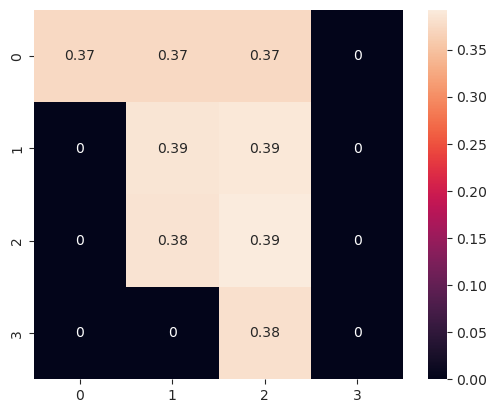

done: clu055

doing: clu059

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:38<00:00,  2.98it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 44505/44505 [01:10<00:00, 634.23it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

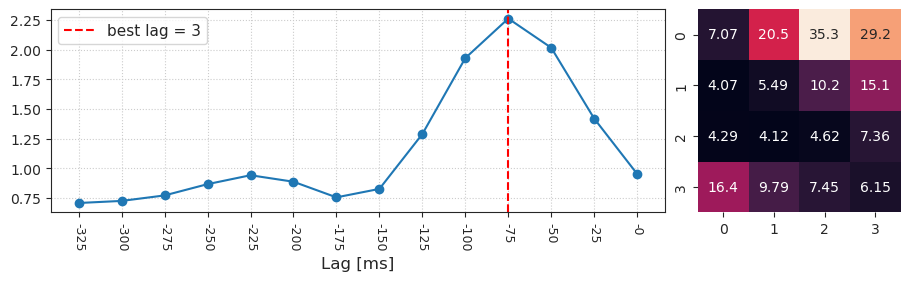

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                      
0.0001   0.613609  0.430668
0.0010   0.614781  0.431068
0.0100   0.617517  0.429409
0.1000   0.610215  0.415703
1.0000   0.562289  0.366509
10.0000  0.429726  0.288951

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 3)

r      nnll
alpha                      
0.0001   0.610581  0.413154
0.0010   0.610664  0.413486
0.0100   0.614625  0.413184
0.1000   0.596822  0.388329
1.0000   0.547553  0.334075
10.0000  0.476196  0.259805

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                      
0.0001   0.578499  0.404122
0.0010   0.578041  0.403160
0.0100   0.581563  0.404276
0.1000   0.568707  0.385796
1.0000   0.505159  0.328142
10.0000  0.423341  0.244903

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (3, 0)

r      nnll
alpha                      
0.0001   0.563207  0.383963
0.0010   0.565553  0.384482
0.0100   0.569294  0.380504
0.1000   0.544375  0.340853
1.0000   0.489445  0.251036
10.0000  0.355582  0.144813

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (1, 3)

r      nnll
alpha                      
0.0001   0.593370  0.392579
0.0010   0.591876  0.392739
0.0100   0.594894  0.393346
0.1000   0.577400  0.368620
1.0000   0.520026  0.307585
10.0000  0.450144  0.228637

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                      
0.0001   0.590643  0.403455
0.0010   0.592986  0.403622
0.0100   0.591111  0.405270
0.1000   0.580589  0.391250
1.0000   0.529729  0.336354
10.0000  0.443228  0.257481

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (3, 1)

r      nnll
alpha                      
0.0001   0.582054  0.390891
0.0010   0.580953  0.390864
0.0100   0.578865  0.389979
0.1000   0.533154  0.359352
1.0000   0.471309  0.277907
10.0000  0.403392  0.161010

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu059, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                      
0.0001   0.591825  0.395384
0.0010   0.593201  0.395498
0.0100   0.590167  0.393670
0.1000   0.565584  0.364985
1.0000   0.490466  0.285152
10.0000  0.404657  0.155048

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.618

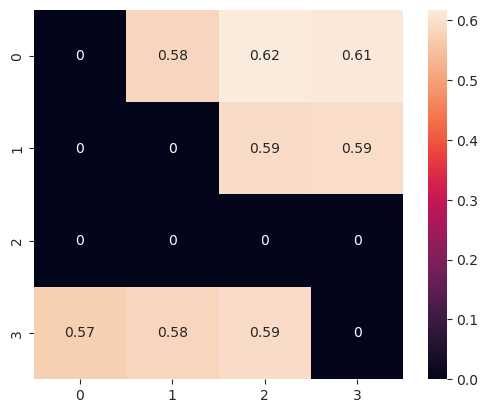

done: clu059

doing: clu061

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:38<00:00,  2.99it/s]


[PROGRESS] features extracted

 95%|██████████████████████████████████  | 24608/25985 [00:39<00:02, 633.99it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

100%|████████████████████████████████████| 24280/24280 [00:38<00:00, 638.73it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

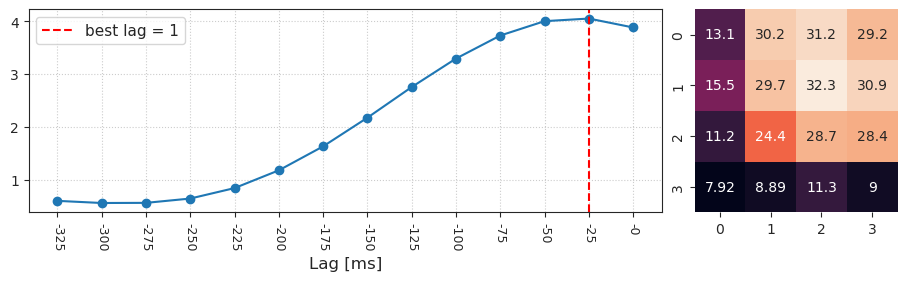

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 2)

None

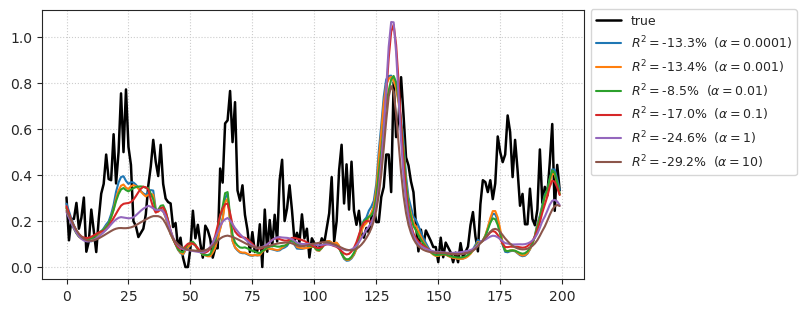

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 2)

None

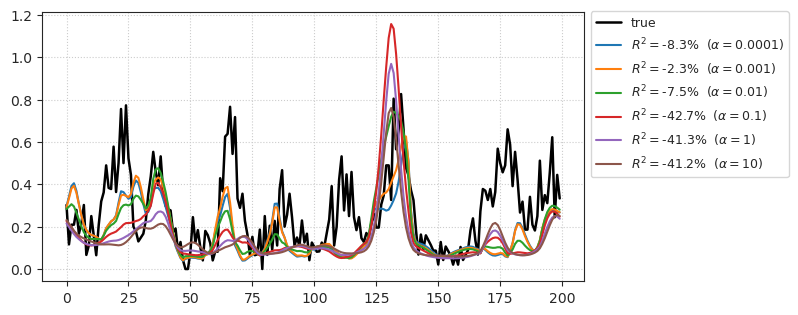

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 3)

None

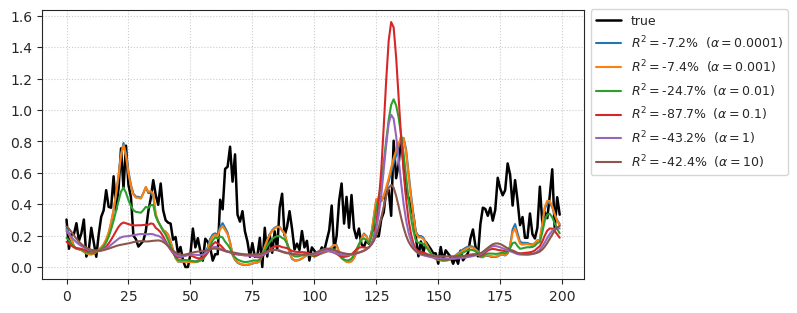

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 1)

None

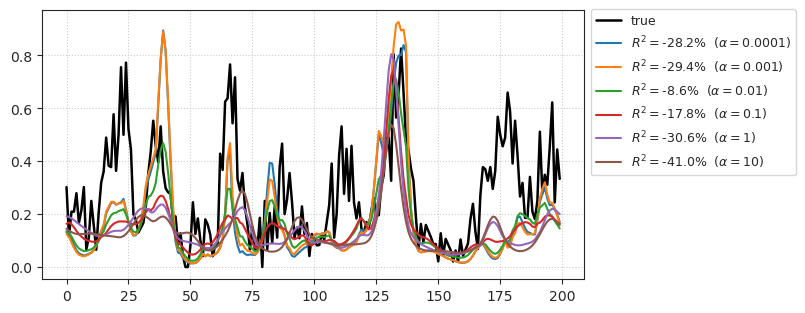

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (1, 1)

None

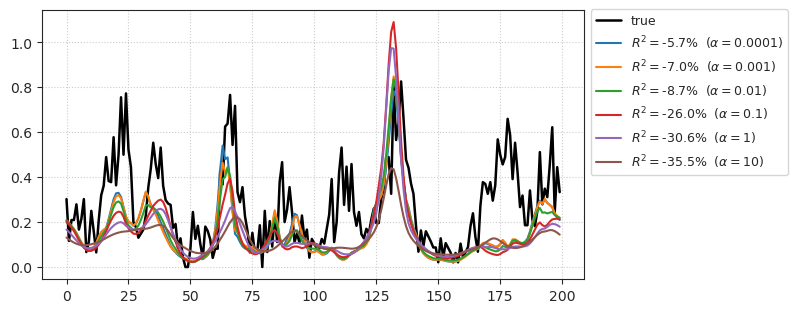

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (0, 3)

None

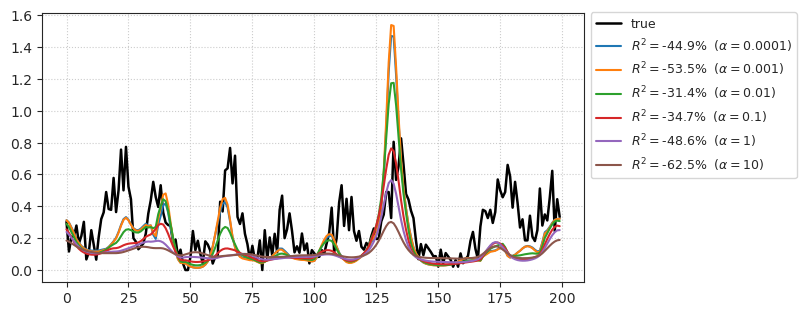

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (2, 2)

None

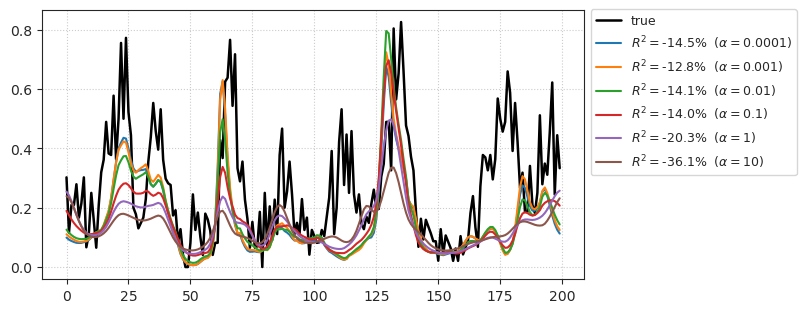

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu096, neuron # 0; pix: (i, j) = (2, 3)

None

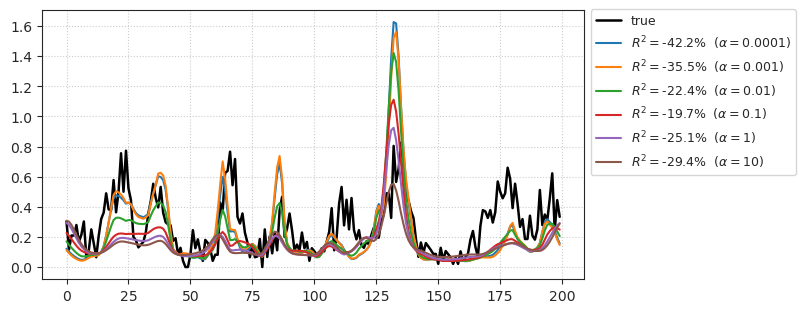

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.01000, best_r = 0.589

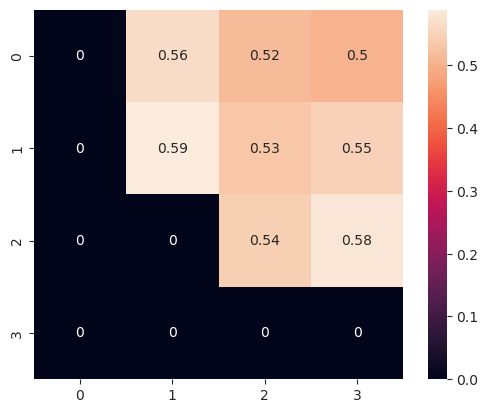

done: clu096

doing: clu099

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  4.23it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 45318/45318 [01:14<00:00, 611.31it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

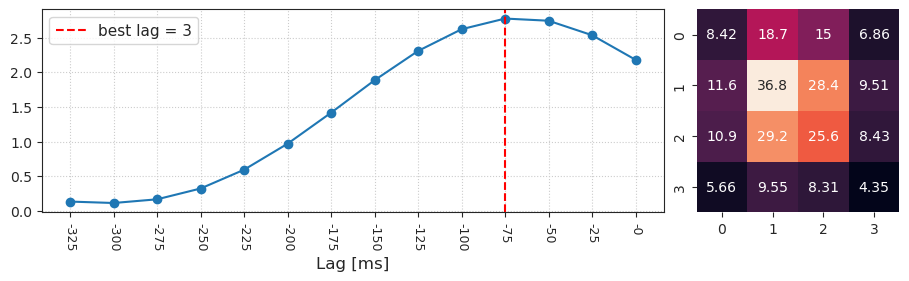

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 1)

None

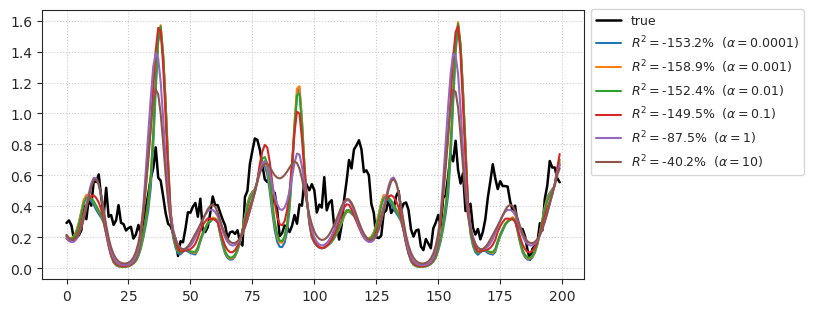

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 1)

None

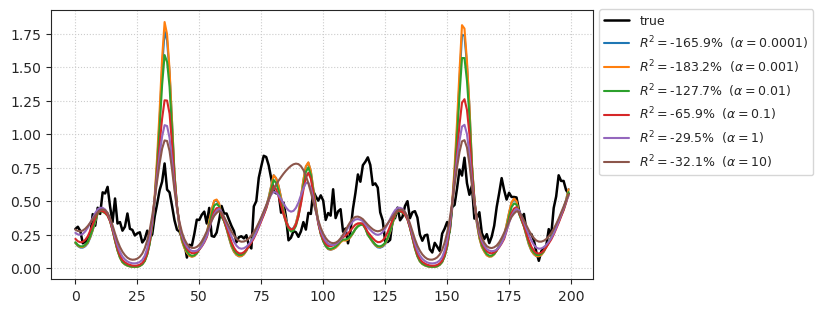

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 2)

None

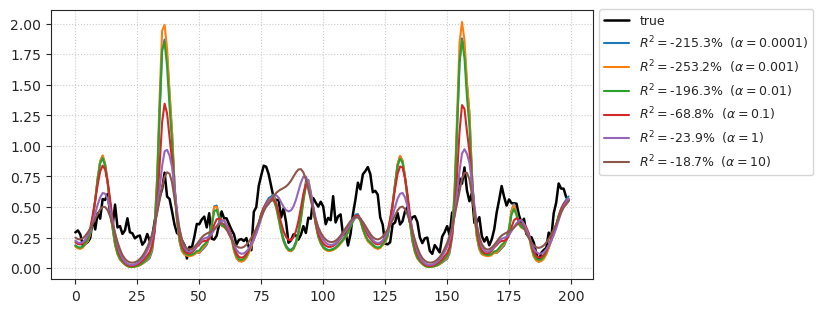

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 2)

None

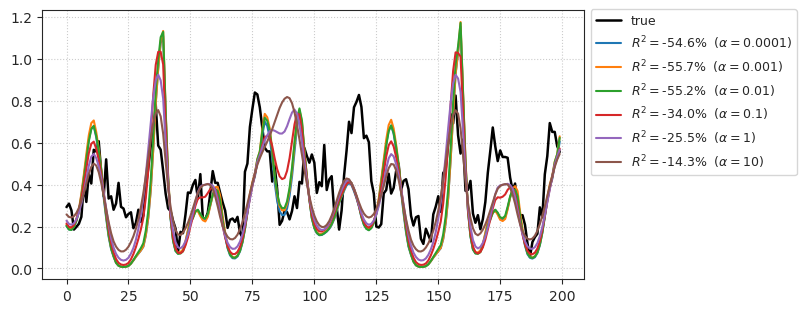

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (0, 1)

None

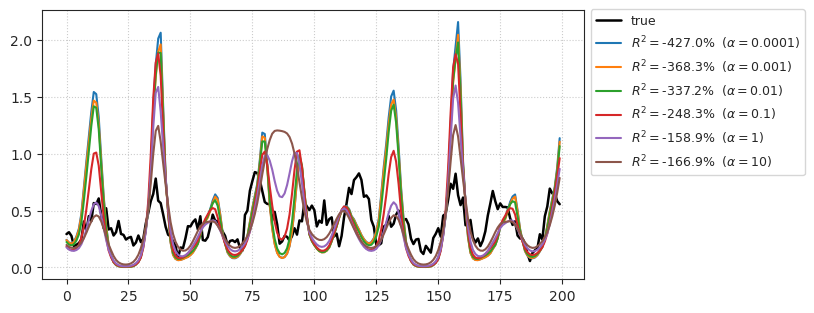

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (0, 2)

None

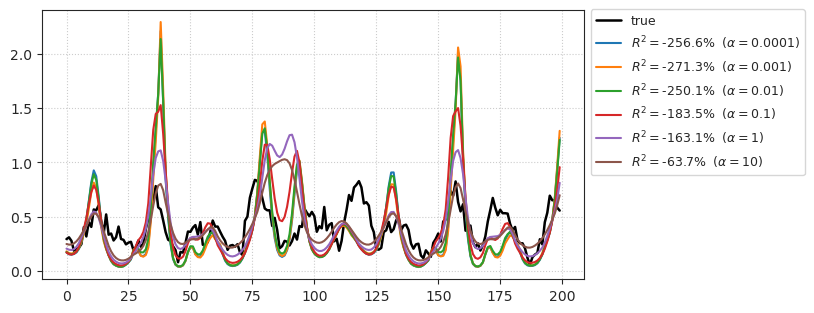

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (1, 0)

None

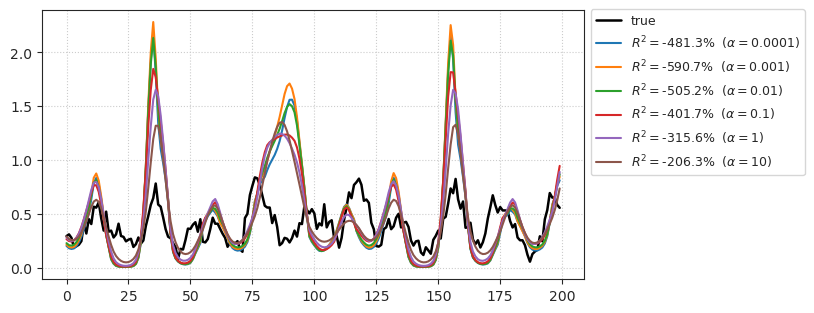

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu099, neuron # 0; pix: (i, j) = (2, 0)

None

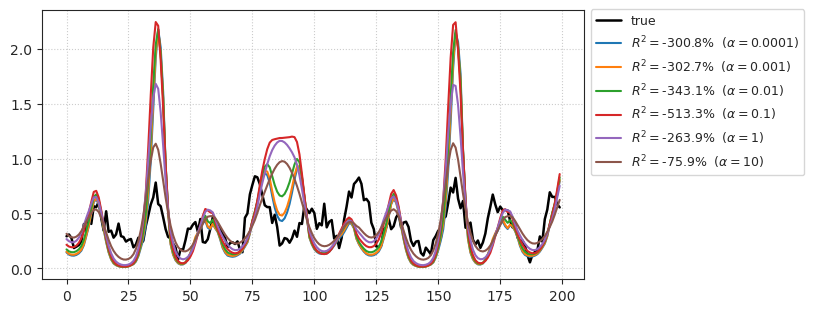

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 0.10000, best_r = 0.586

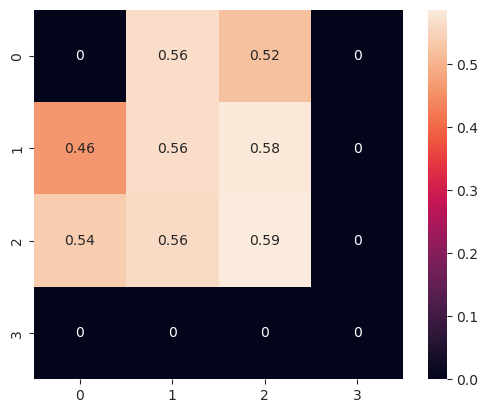

done: clu099

doing: clu104

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  3.57it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 38585/38585 [01:00<00:00, 639.94it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

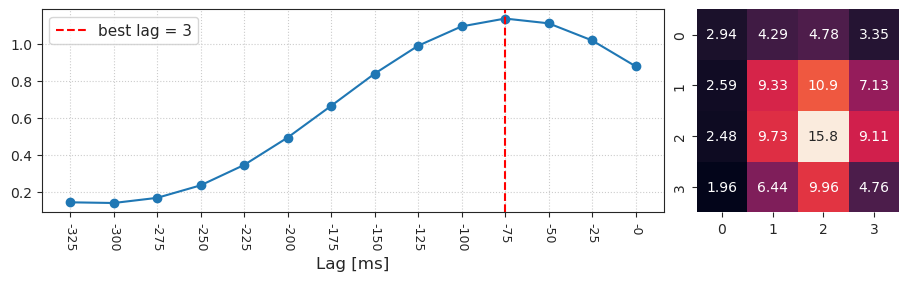

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 2)

None

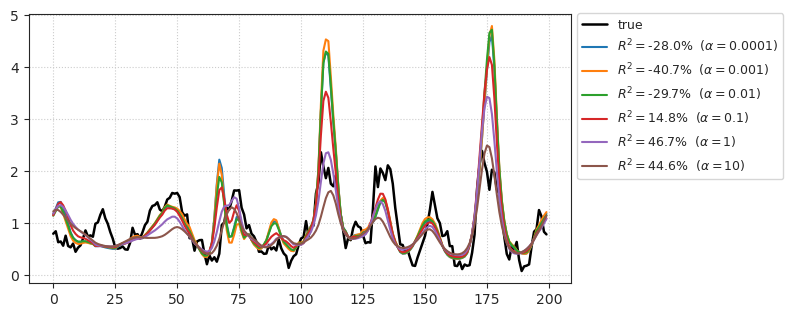

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 2)

None

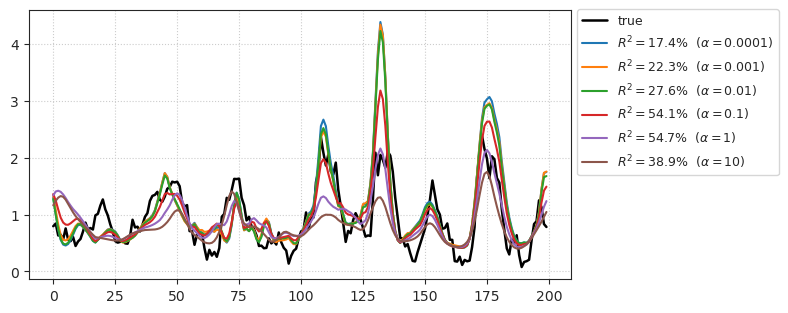

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (3, 2)

None

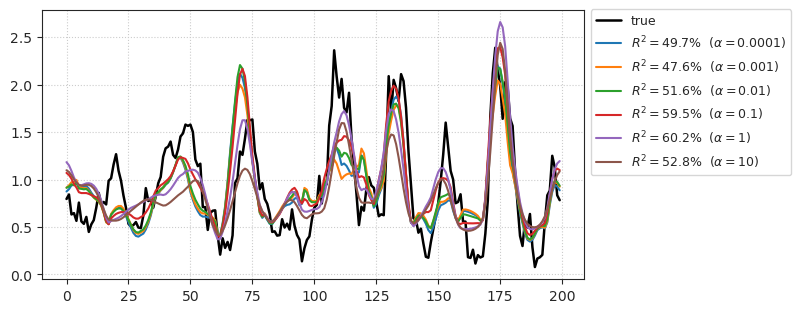

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 1)

None

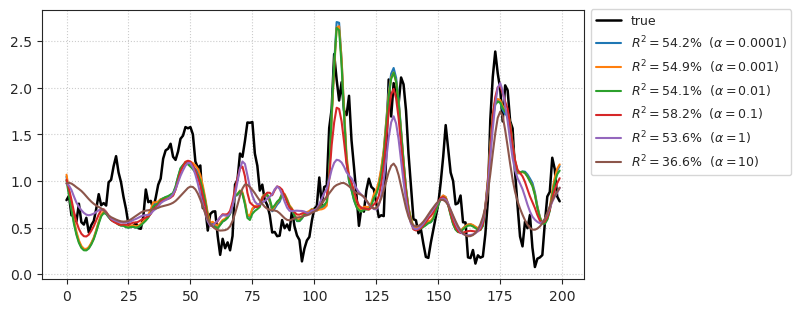

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 1)

None

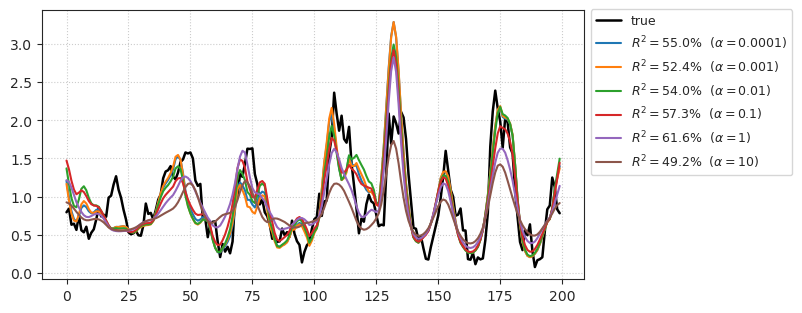

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (2, 3)

None

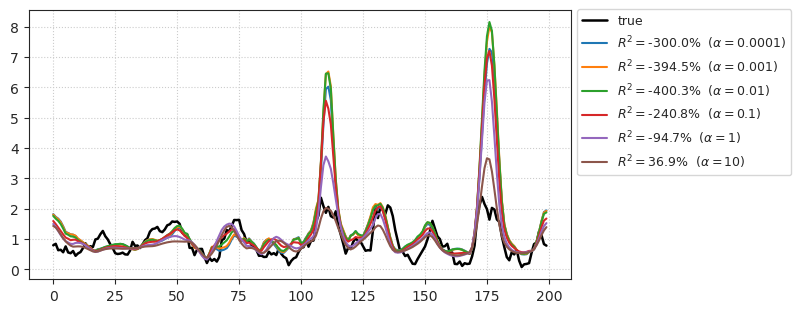

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (1, 3)

None

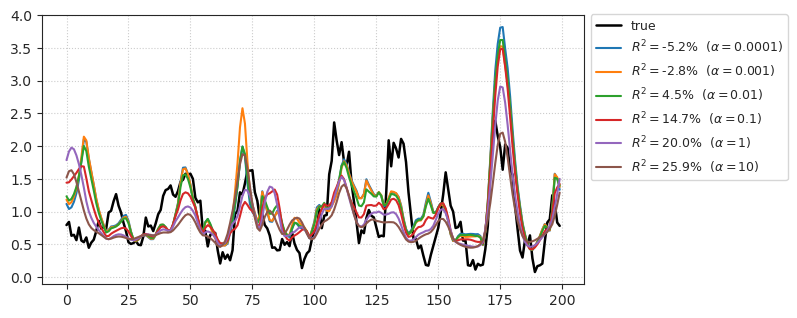

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
clu104, neuron # 0; pix: (i, j) = (3, 1)

None

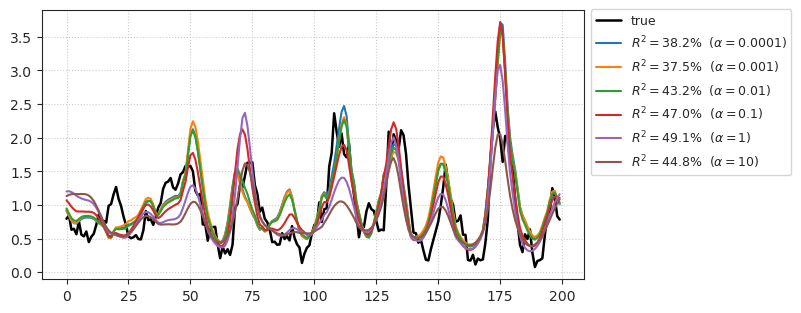

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

best alpha = 10.00000, best_r = 0.813

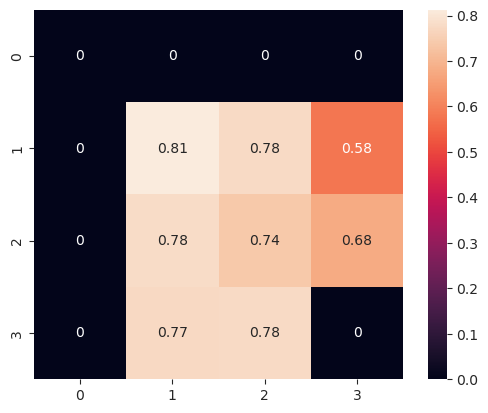

done: clu104

doing: clu107

[PROGRESS] neural data loaded

 64%|██████████████████████████▊               | 92/144 [00:31<00:17,  2.93it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
%%time

perf_all, alpha_all = [], []
for expt in h5py.File(vae.cfg.h_file):
    print(f'doing: {expt}')
    ro = ReadoutGLM(
        expt=expt,
        tr=tr,
        n_lags=13,
        n_top_pix=8,
        verbose=True,
    ).fit()
    
    useful = vae.cfg.useful_cells.get(expt, None)
    useful = useful if useful else [0]
    for idx in useful:
        ro.show(idx)
        perf_r, _ = ro.fit_neuron(idx, brief=True)
        alpha_all.append(ro.alphas[idx])
        perf_all.append(ro.perf[idx])
        sns.heatmap(perf_r, square=True, annot=True)
        plt.show()
    print(f'done: {expt}')
    print('\n\n')

### ```expt=clu090```

In [4]:
%%time

ro = ReadoutGLM(
    expt='clu090',
    tr=tr,
    n_lags=6,
    n_top_pix=8,
    verbose=True,
).fit()

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  3.93it/s]


[PROGRESS] features extracted

100%|███████████████████████████████████| 54386/54386 [00:43<00:00, 1236.07it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

CPU times: user 2min 9s, sys: 31.3 s, total: 2min 41s
Wall time: 2min 40s


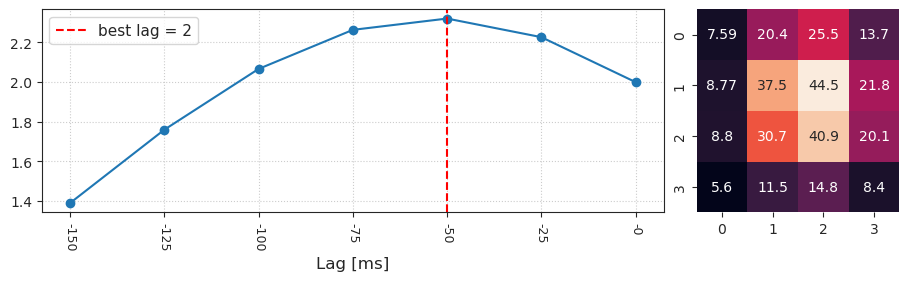

In [5]:
ro.show(0)

In [6]:
ro.top_pix

array([[[1, 2],
        [2, 2],
        [1, 1],
        [2, 1],
        [0, 2],
        [1, 3],
        [0, 1],
        [2, 3]]])

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (1, 2)

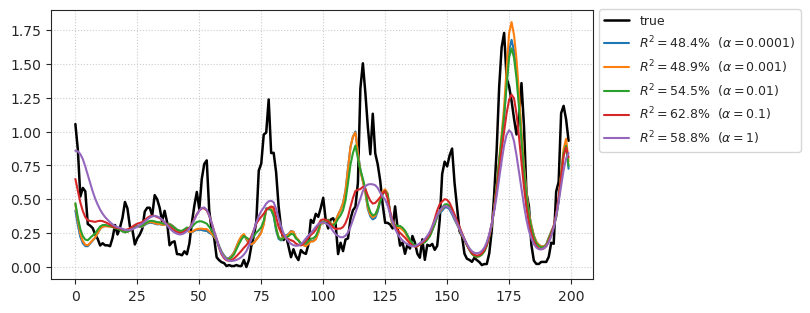

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (2, 2)

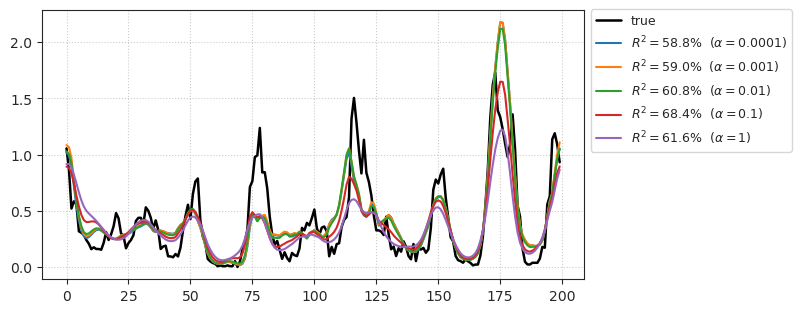

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (1, 1)

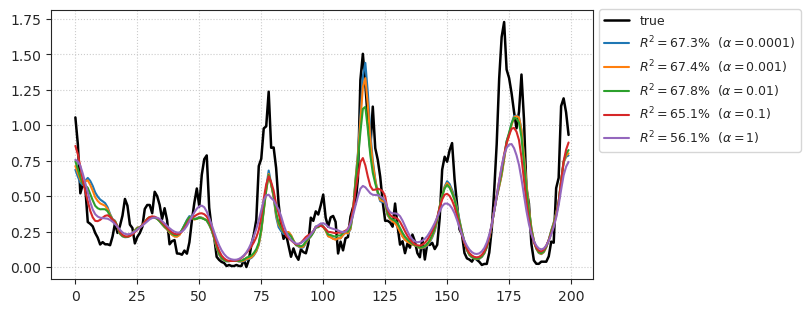

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (2, 1)

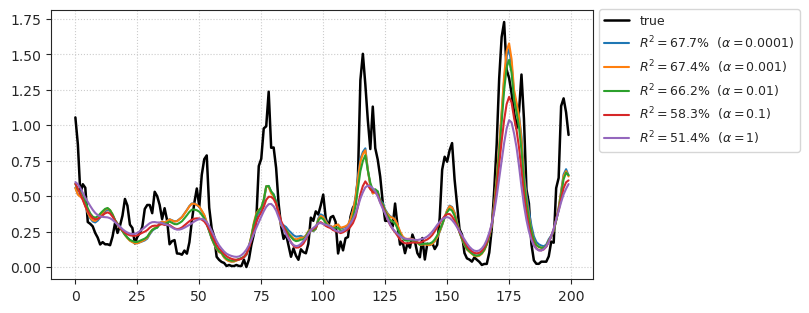

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (0, 2)

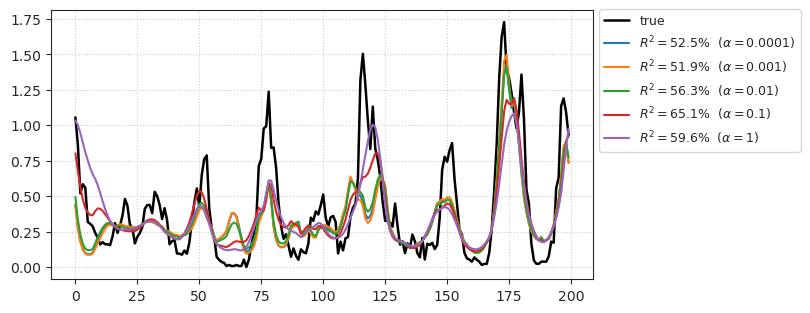

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (1, 3)

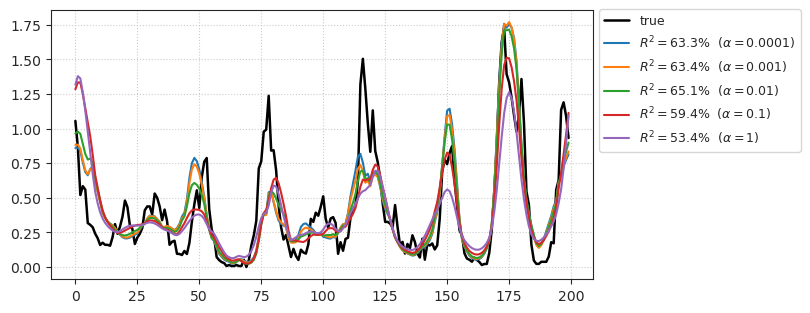

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (0, 1)

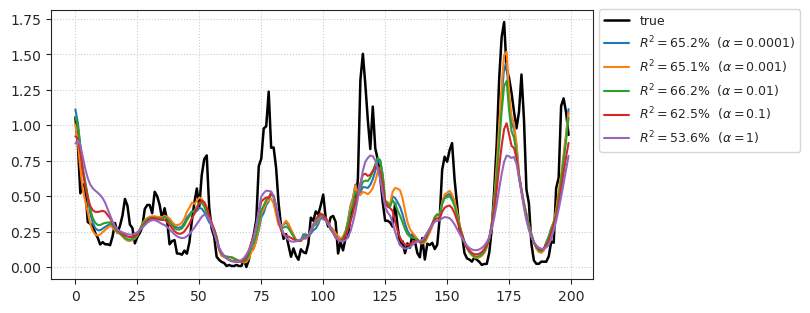

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (2, 3)

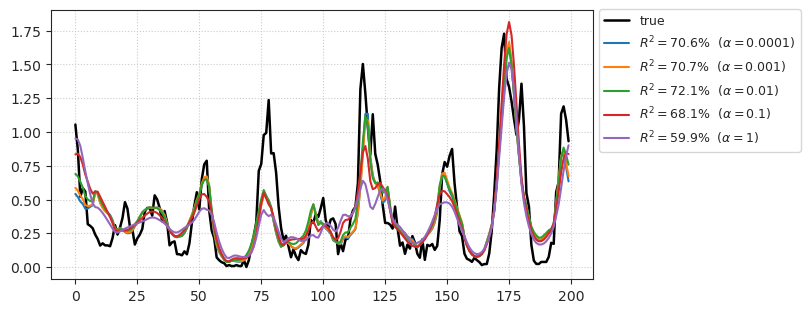

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

0.1 0.8900157938580191

CPU times: user 2h 6min 4s, sys: 4min 51s, total: 2h 10min 55s
Wall time: 15min 40s


In [7]:
%%time

perf_r, perf_r2 = ro.fit_neuron(0)

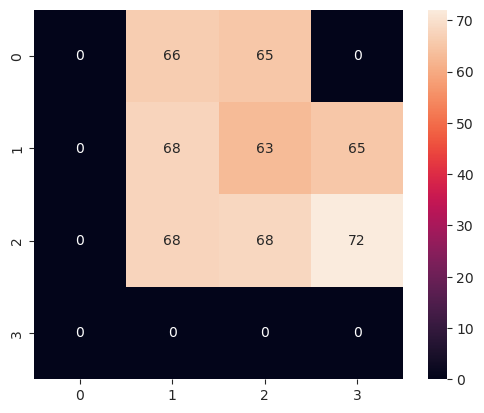

In [8]:
sns.heatmap(perf_r2, square=True, annot=True);

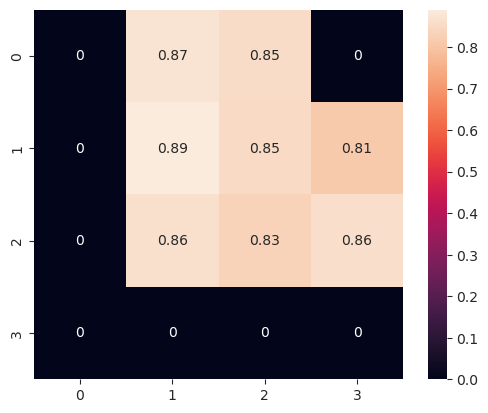

In [9]:
sns.heatmap(perf_r, square=True, annot=True);

In [23]:
data = ro.get_data(0)

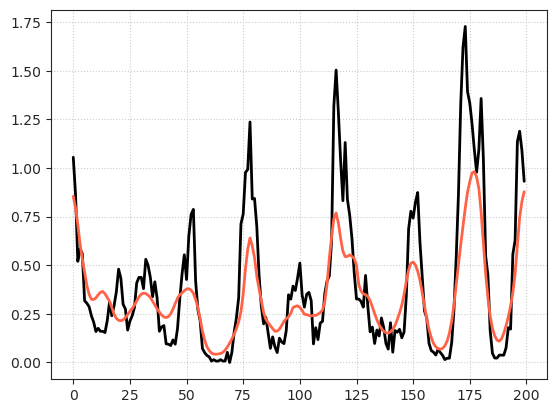

In [25]:
pred = ro.models[0].predict(ro.x_r[0])

plt.plot(data['y_tst'], color='k', lw=2)
plt.plot(pred, color='tomato', lw=2)
plt.grid();

In [18]:
sp_stats.pearsonr(true, pred)[0], sk_metric.r2_score(true, pred)

(0.8900157938580191, 0.6510125703237859)

In [21]:
len(ro.good)

54386

In [22]:
len(ro.x[0])

54386

### expt=```clu055```

In [4]:
%%time

ro = ReadoutGLM(
    expt='clu055',
    tr=tr,
    n_lags=11,
    n_top_pix=8,
    verbose=True,
).fit()

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████| 116/116 [00:41<00:00,  2.79it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 36178/36178 [00:49<00:00, 736.15it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

CPU times: user 1min 56s, sys: 25 s, total: 2min 21s
Wall time: 2min 20s


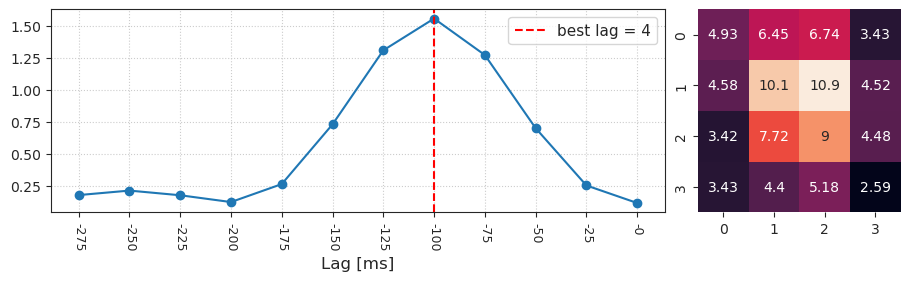

In [5]:
ro.show(0)

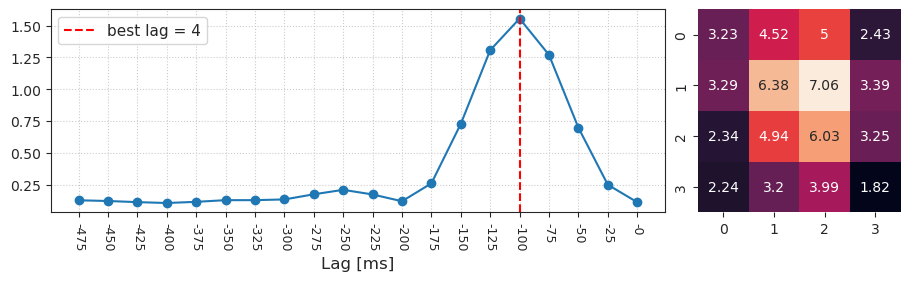

In [6]:
ro.top_pix

array([[[1, 2],
        [1, 1],
        [2, 2],
        [2, 1],
        [0, 2],
        [0, 1],
        [3, 2],
        [0, 0]]])

r      nnll
alpha                     
0.0001  0.385335  0.211979
0.0010  0.384360  0.211407
0.0100  0.388309  0.212895
0.1000  0.384600  0.202633
1.0000  0.363815  0.173187

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (1, 2)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.381785  0.200173
0.0010  0.385009  0.201643
0.0100  0.385028  0.204345
0.1000  0.384907  0.199975
1.0000  0.361573  0.168550

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (1, 1)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.388899  0.212533
0.0010  0.390475  0.212741
0.0100  0.392319  0.214284
0.1000  0.385508  0.202738
1.0000  0.356265  0.166910

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (2, 2)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.379172  0.205512
0.0010  0.378177  0.204790
0.0100  0.383978  0.207378
0.1000  0.379823  0.196254
1.0000  0.359628  0.167905

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (2, 1)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.360352  0.189104
0.0010  0.363864  0.191178
0.0100  0.372574  0.196437
0.1000  0.372758  0.183456
1.0000  0.348320  0.155140

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (0, 2)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.369167  0.181312
0.0010  0.369274  0.180226
0.0100  0.373068  0.182393
0.1000  0.361565  0.167632
1.0000  0.326265  0.139137

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (0, 1)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.380515  0.203154
0.0010  0.381256  0.202375
0.0100  0.380625  0.201708
0.1000  0.358376  0.175648
1.0000  0.324972  0.139886

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (3, 2)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

r      nnll
alpha                     
0.0001  0.372194  0.187229
0.0010  0.373394  0.188154
0.0100  0.372543  0.185390
0.1000  0.350301  0.162975
1.0000  0.312944  0.129387

--------------------------------------------------------------------------------
neuron # 0, pix: (i, j) = (0, 0)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

0.01 0.3923189907276565

CPU times: user 2h 48min 38s, sys: 5min 23s, total: 2h 54min 1s
Wall time: 15min 1s


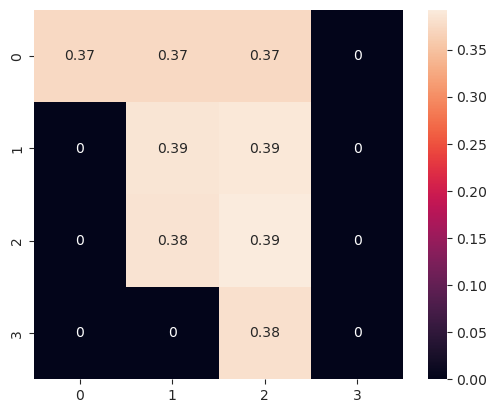

In [8]:
sns.heatmap(perf_r, square=True, annot=True);

In [7]:
%%time

perf_r, perf_r2 = ro.fit_neuron(0, brief=False)

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (1, 2)

r      nnll
alpha                     
0.0001  0.390819  0.223084
0.0010  0.391277  0.223260
0.0100  0.394766  0.225228
0.1000  0.392298  0.216672
1.0000  0.370052  0.186924

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (1, 1)

r      nnll
alpha                     
0.0001  0.385765  0.216277
0.0010  0.387407  0.216839
0.0100  0.388710  0.218571
0.1000  0.388559  0.212513
1.0000  0.365729  0.182586

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (2, 2)

r      nnll
alpha                     
0.0001  0.390524  0.220739
0.0010  0.391766  0.220942
0.0100  0.394360  0.222287
0.1000  0.391905  0.214375
1.0000  0.367483  0.182893

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (2, 1)

r      nnll
alpha                     
0.0001  0.379516  0.214772
0.0010  0.378374  0.213973
0.0100  0.382953  0.217131
0.1000  0.381250  0.208825
1.0000  0.364243  0.181903

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (0, 2)

r      nnll
alpha                     
0.0001  0.372159  0.203629
0.0010  0.375147  0.205765
0.0100  0.379770  0.208298
0.1000  0.376472  0.196218
1.0000  0.352011  0.168272

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (0, 1)

r      nnll
alpha                     
0.0001  0.370688  0.194319
0.0010  0.372618  0.195820
0.0100  0.376771  0.198505
0.1000  0.370172  0.187426
1.0000  0.342600  0.160470

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (3, 2)

r      nnll
alpha                     
0.0001  0.378537  0.207667
0.0010  0.381185  0.208774
0.0100  0.386348  0.212161
0.1000  0.374381  0.194665
1.0000  0.345394  0.161657

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
expt = clu055, neuron # 0; pix: (i, j) = (0, 0)

r      nnll
alpha                     
0.0001  0.371936  0.197642
0.0010  0.373561  0.198630
0.0100  0.377329  0.200183
0.1000  0.361038  0.180443
1.0000  0.329652  0.147053

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

0.01 0.3947662064561913

CPU times: user 6h 52min 46s, sys: 13min 51s, total: 7h 6min 38s
Wall time: 30min 59s


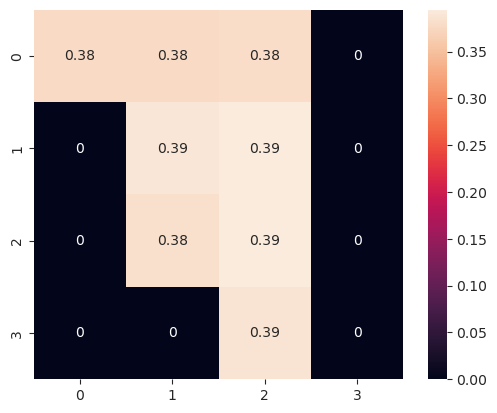

In [8]:
sns.heatmap(perf_r, square=True, annot=True);

In [23]:
data = ro.get_data(0)

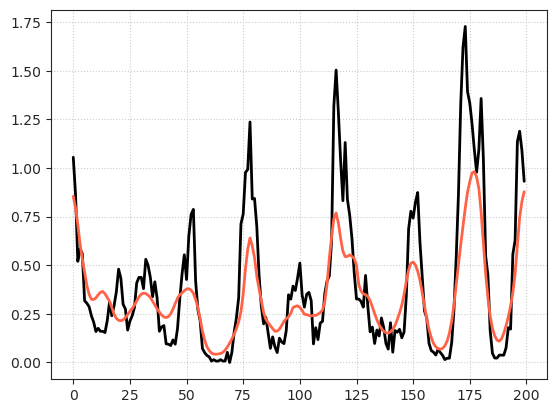

In [25]:
pred = ro.models[0].predict(ro.x_r[0])

plt.plot(data['y_tst'], color='k', lw=2)
plt.plot(pred, color='tomato', lw=2)
plt.grid();

In [18]:
sp_stats.pearsonr(true, pred)[0], sk_metric.r2_score(true, pred)

(0.8900157938580191, 0.6510125703237859)

In [21]:
len(ro.good)

54386

In [22]:
len(ro.x[0])

54386

In [19]:
glm.models

{0.0001: PoissonRegressor(alpha=0.0001),
 0.001: PoissonRegressor(alpha=0.001),
 0.01: PoissonRegressor(alpha=0.01),
 0.1: PoissonRegressor(alpha=0.1),
 1: PoissonRegressor(alpha=1)}

In [22]:
alpha, r = max(glm.r_tst.items(), key=lambda t: t[1])
alpha, r

(0.01, 0.859147242566406)

In [23]:
glm.models

{0.0001: PoissonRegressor(alpha=0.0001),
 0.001: PoissonRegressor(alpha=0.001),
 0.01: PoissonRegressor(alpha=0.01),
 0.1: PoissonRegressor(alpha=0.1),
 1: PoissonRegressor(alpha=1)}

--------------------------------------------------------------------------------
(i, j) = (0, 0)

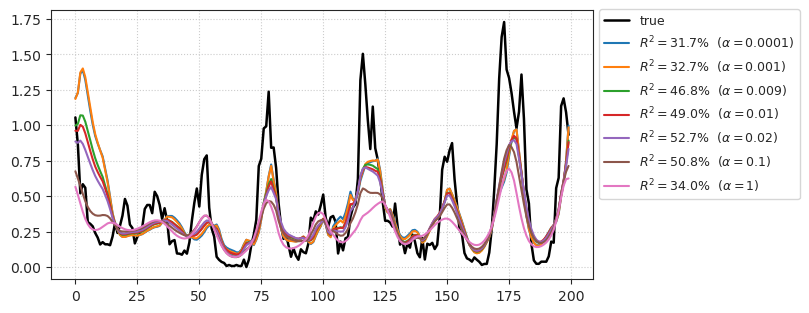

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 1)

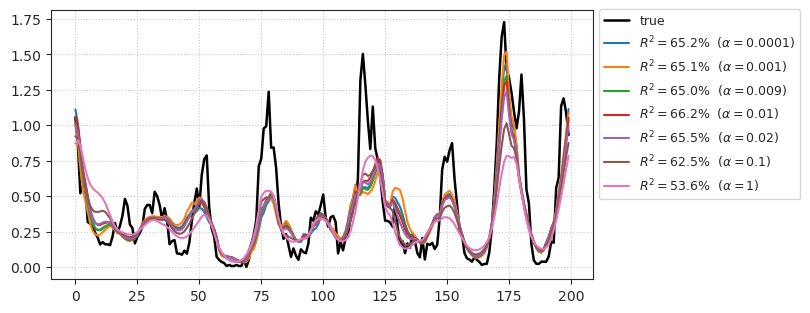

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 2)

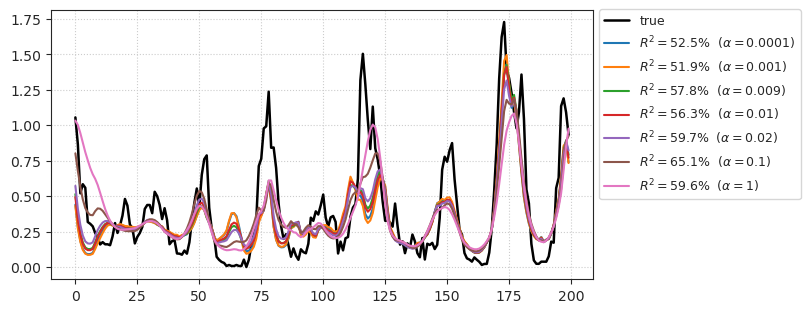

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 3)

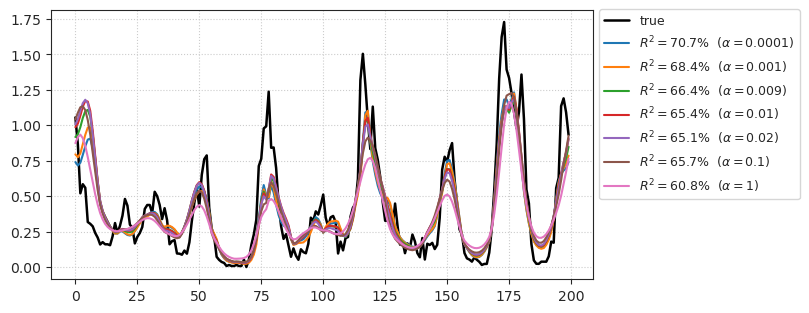

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 0)

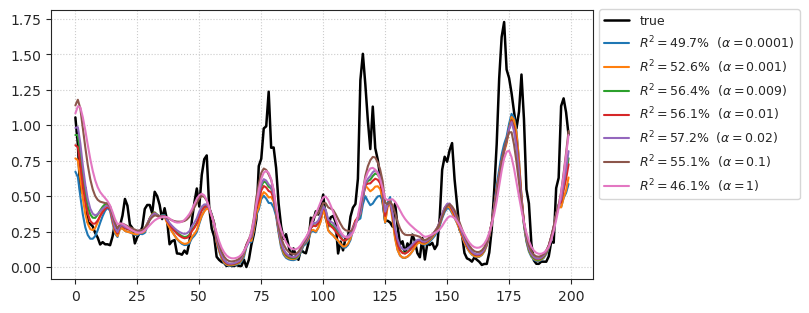

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 1)

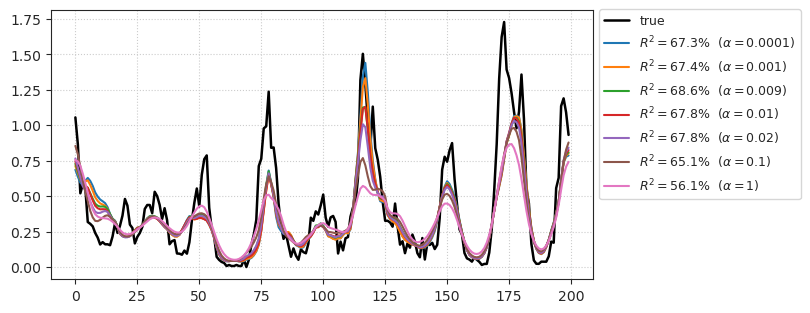

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 2)

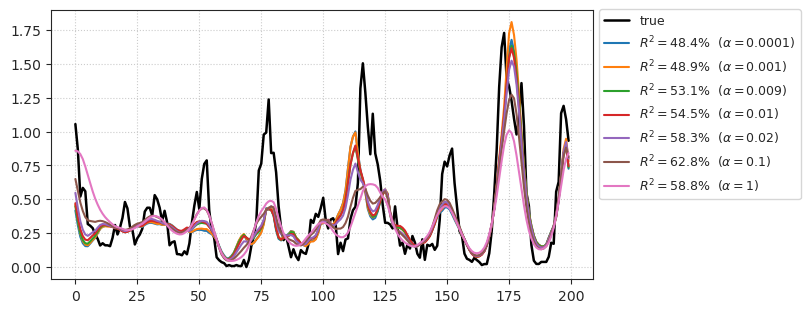

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 3)

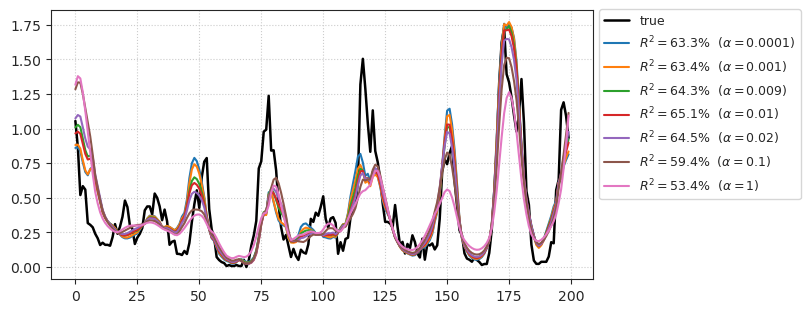

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 0)

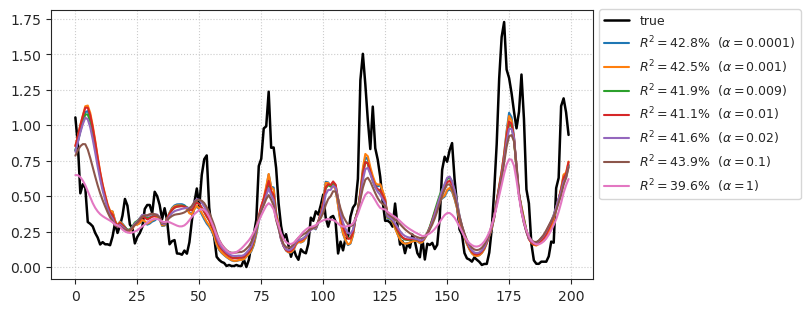

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 1)

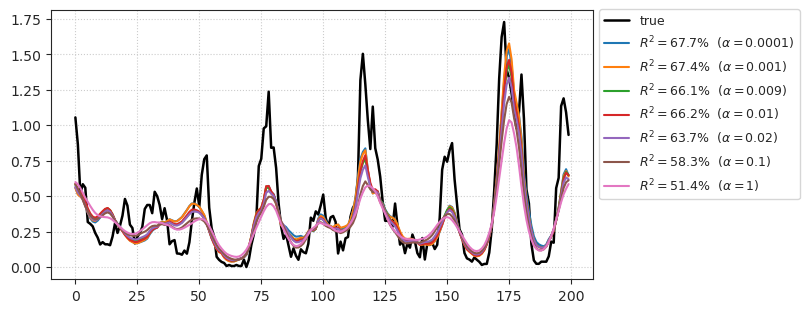

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 2)

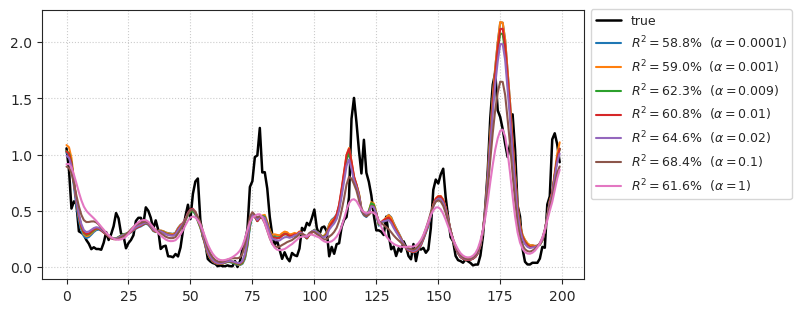

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 3)

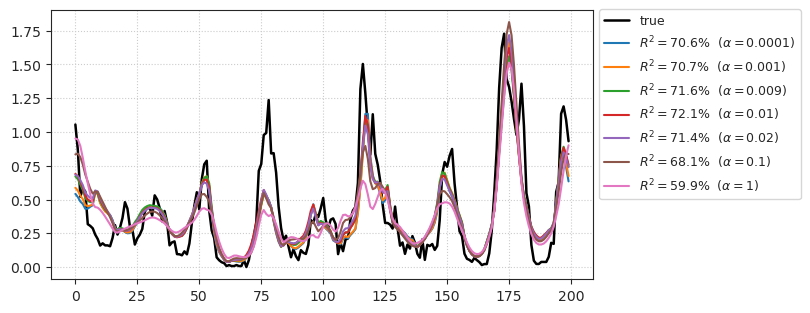

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 0)

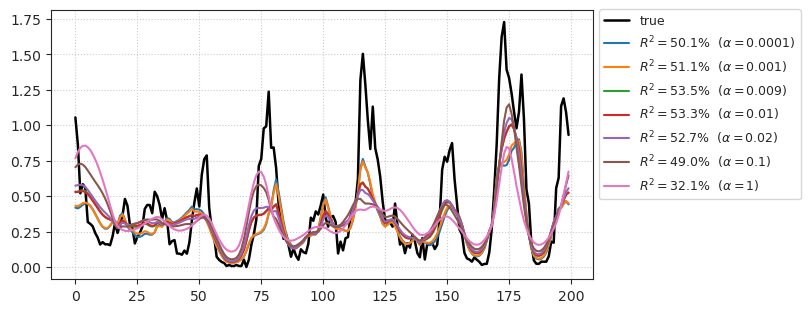

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 1)

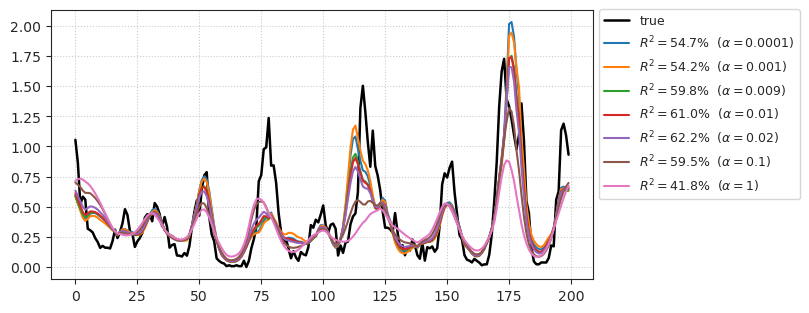

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 2)

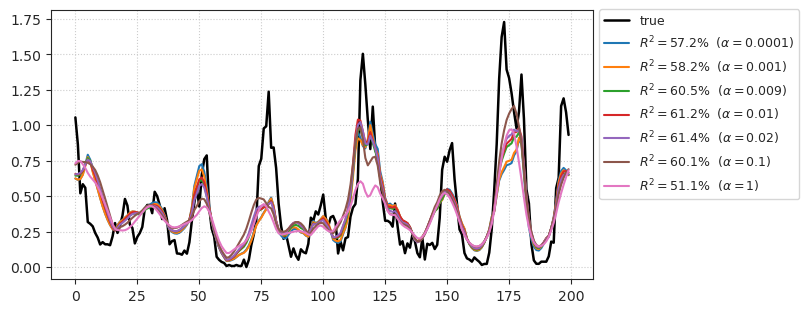

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 3)

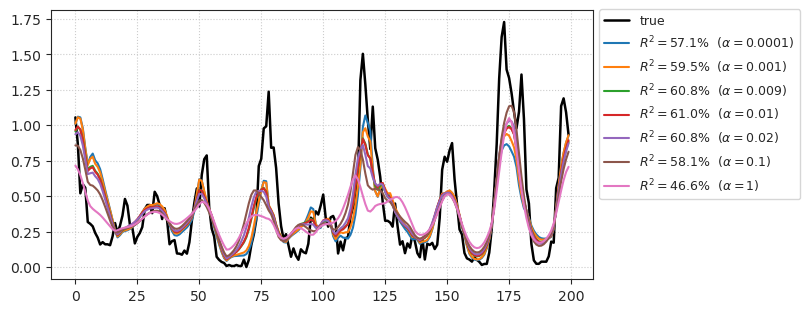

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

CPU times: user 5h 22min 55s, sys: 12min 40s, total: 5h 35min 35s
Wall time: 42min 8s


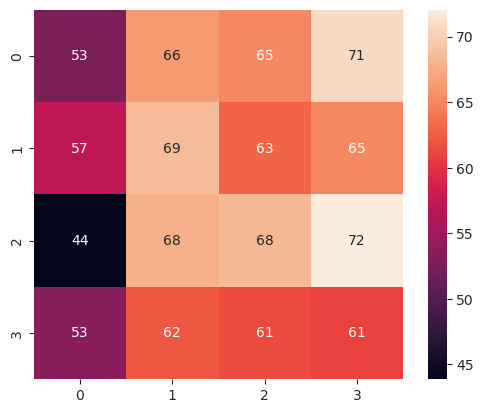

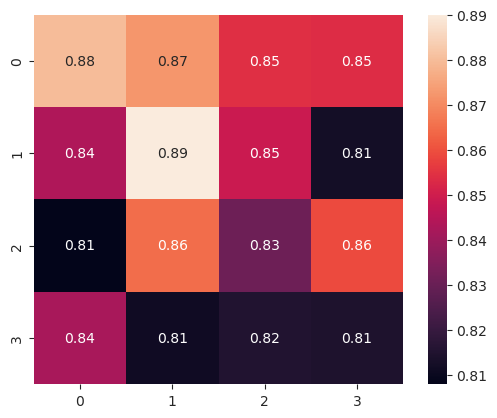

In [28]:
results_r[ro.top_pix[0, :, 0], ro.top_pix[0, :, 1]]

array([0.84886925, 0.83103738, 0.89001579, 0.86487196, 0.85413754,
       0.8121869 , 0.85914724, 0.87235896])

In [29]:
results_r2[ro.top_pix[0, :, 0], ro.top_pix[0, :, 1]]

array([62.83367874, 68.35893869, 68.586928  , 67.71101472, 65.0733857 ,
       65.05647867, 72.0552217 , 66.24832402])

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  4.00it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 54381/54381 [03:09<00:00, 287.17it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

CPU times: user 4min 35s, sys: 30.5 s, total: 5min 5s
Wall time: 5min 4s


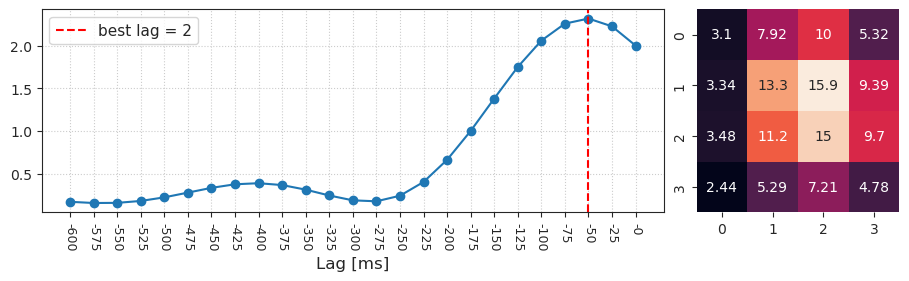

array([[[1, 2],
        [2, 2],
        [1, 1],
        [2, 1],
        [0, 2],
        [2, 3],
        [1, 3],
        [0, 1]]])

In [ ]:
%%time

neuron_i = 0
lag = ro.best_lags[neuron_i]
inds = ro.good.copy()
inds = inds[inds > lag]

glm_kws = dict(
    category='PoissonRegressor',
    y=ro.spks[inds, neuron_i],
    y_tst=np.nanmean(ro.spks_r[neuron_i], 0),
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
results = np.zeros((4, 4))
for i, j in itertools.product(range(4), range(4)):
    glm_kws['x'] = ro.pcs[neuron_i].transform(ro.enc[..., i, j])[inds - lag]
    glm_kws['x_tst'] = ro.pcs[neuron_i].transform(ro.enc_r[..., i, j])[ro.good_r - lag]
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        glm = LinearModel(**glm_kws).fit(
            fit_df=False, max_iter=100)
    results[i, j] = max(glm.r_tst.values())
    print('-' * 80 + f"\n(i, j) = ({i}, {j})\nr = {glm.r_tst}")
    glm.show_pred()
    print('~' * 80)
    print('\n\n')

sns.heatmap(results, square=True, annot=True);

In [7]:
ro.best_pix

array([[2, 3]])

In [8]:
ro.best_pix_all

array([[[1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [2, 2],
        [2, 2],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3],
        [2, 3]]])

In [9]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{
    0.0001: 71.00339682681474,
    0.001: 71.25099242388694,
    0.009: 71.88164953637882,
    0.01: 72.02709335918784,
    0.02: 71.80693910862614,
    0.1: 68.21239130831177,
    1: 59.87759377600238
}

CPU times: user 4min 45s, sys: 113 ms, total: 4min 45s
Wall time: 11.2 s


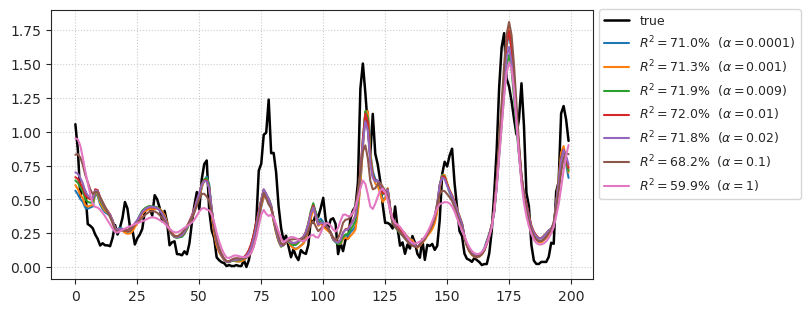

In [10]:
glm.show_pred();

In [25]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[0.01],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{0.01: 72.02709335918784}

CPU times: user 44.4 s, sys: 54.1 ms, total: 44.5 s
Wall time: 1.82 s


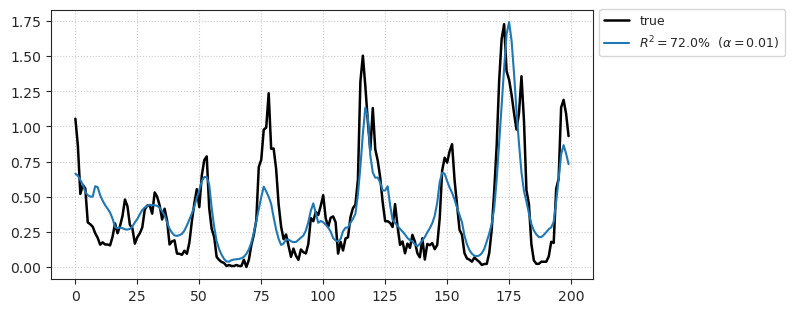

In [26]:
glm.show_pred();

### ```expt=clu096```

In [27]:
%%time

ro = ReadoutGLM(
    expt='clu096',
    tr=tr,
    n_lags=24,
    pix_method='count',
    verbose=True,
).fit()

[PROGRESS] neural data loaded

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  4.34it/s]


[PROGRESS] features extracted

100%|████████████████████████████████████| 24275/24275 [01:20<00:00, 299.72it/s]


[PROGRESS] sta computed

[PROGRESS] best lag estimated

[[0 3]]

[PROGRESS] fitting PCA done

CPU times: user 6min 13s, sys: 17.1 s, total: 6min 30s
Wall time: 2min 21s


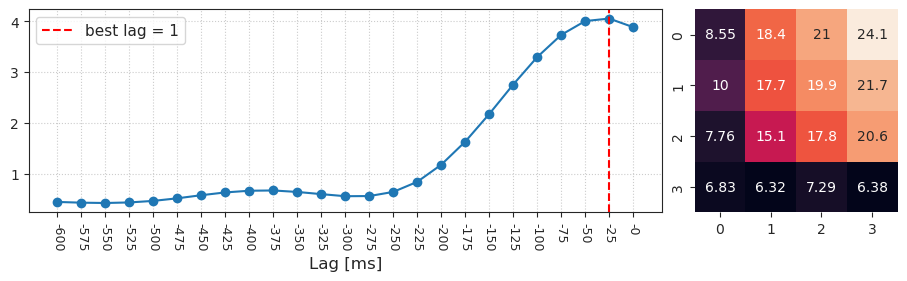

In [28]:
ro.show(0)

In [29]:
ro.best_pix

array([[0, 3]])

In [30]:
ro.best_pix_all

array([[[1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [1, 2],
        [0, 1],
        [0, 1],
        [0, 1],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3],
        [0, 3]]])

In [33]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r_tst)

{
    0.0001: 0.46583701864384136,
    0.001: 0.4831648625779593,
    0.009: 0.4996616234320155,
    0.01: 0.49875723668029953,
    0.02: 0.5004891394703513,
    0.1: 0.4812740293711421,
    1: 0.4371286393655176
}

CPU times: user 1min 35s, sys: 32.2 ms, total: 1min 35s
Wall time: 3.77 s


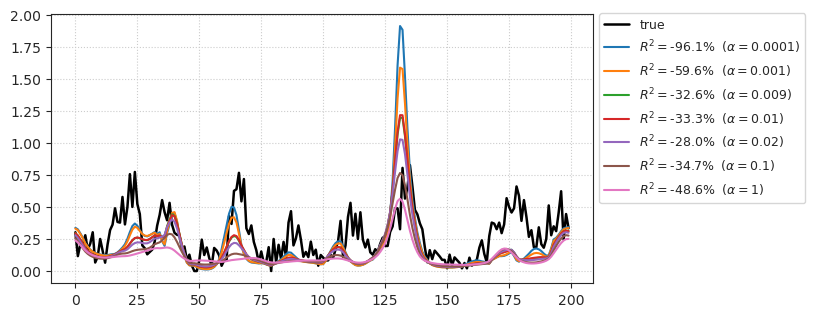

In [34]:
glm.show_pred();

In [49]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[0.02],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r_tst)

{0.02: 0.5004891394703513}

CPU times: user 15.1 s, sys: 34.8 ms, total: 15.1 s
Wall time: 641 ms


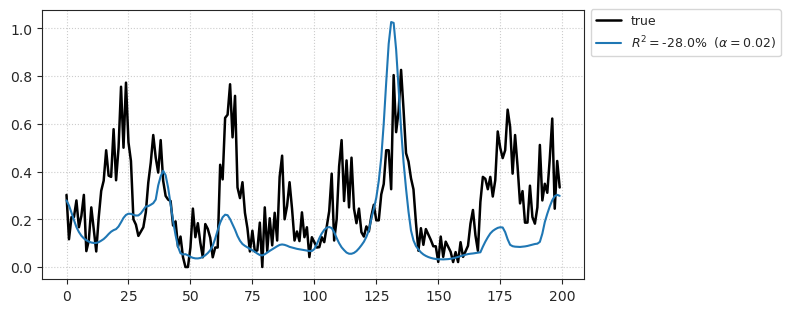

In [50]:
glm.show_pred();

In [53]:
ro.pcs[neuron_i]

PCA(n_components=500, svd_solver='full')

--------------------------------------------------------------------------------
(i, j) = (0, 0)
r = {0.0001: 0.34877088978794746, 0.001: 0.3771491567814116, 0.009: 0.46254433959947494, 
0.01: 0.4649104826208425, 0.02: 0.48755714862925403, 0.1: 0.4983419046205056, 1: 
0.49795518893012614}

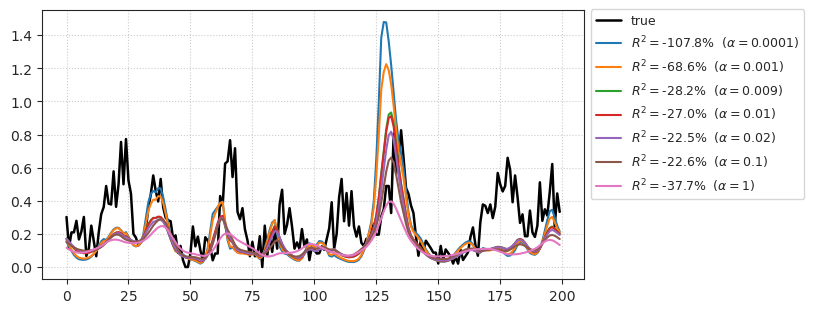

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 1)
r = {0.0001: 0.5004748914296463, 0.001: 0.5006306081057542, 0.009: 0.5365920667077421, 0.01: 
0.541576003367435, 0.02: 0.5381293743724551, 0.1: 0.5074560840024449, 1: 0.43680026554356866}

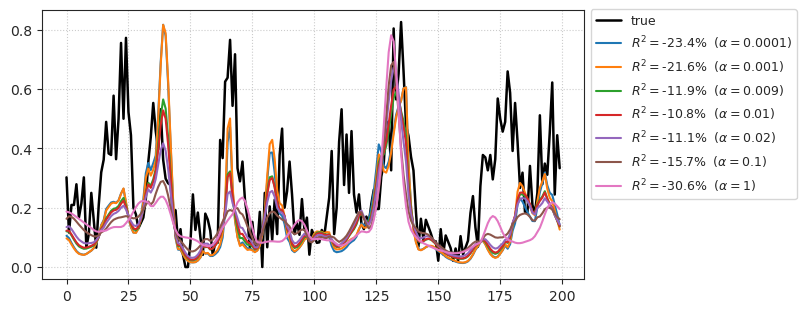

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 2)
r = {0.0001: 0.48144302375107745, 0.001: 0.4959011078204638, 0.009: 0.5245172057580034, 0.01:
0.5241131988942762, 0.02: 0.504473383759992, 0.1: 0.4551397255918809, 1: 0.42205873140715233}

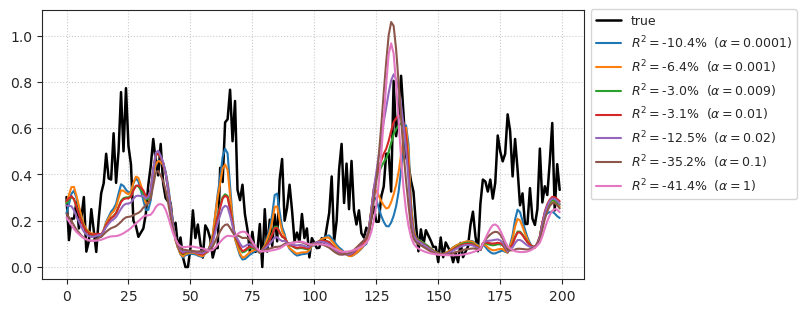

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 3)
r = {0.0001: 0.4680457218218236, 0.001: 0.4897803109013513, 0.009: 0.49539670961269766, 0.01:
0.499705768672002, 0.02: 0.500400027440839, 0.1: 0.48138955917610715, 1: 0.4371431321148375}

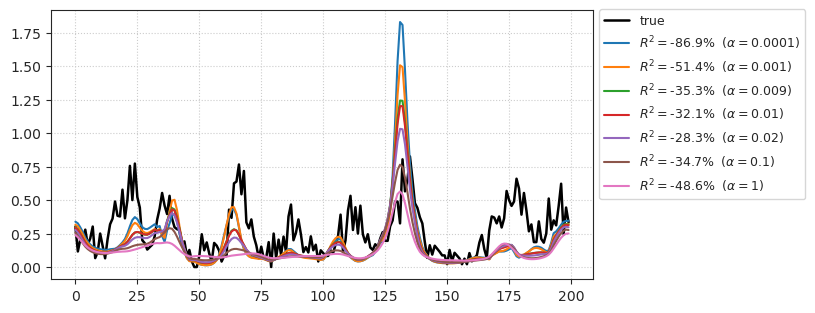

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 0)
r = {0.0001: 0.5174697791302533, 0.001: 0.5261042505521194, 0.009: 0.553897688984175, 0.01: 
0.5500648558209988, 0.02: 0.5431556674299679, 0.1: 0.5095873061386444, 1: 0.4877840641560536}

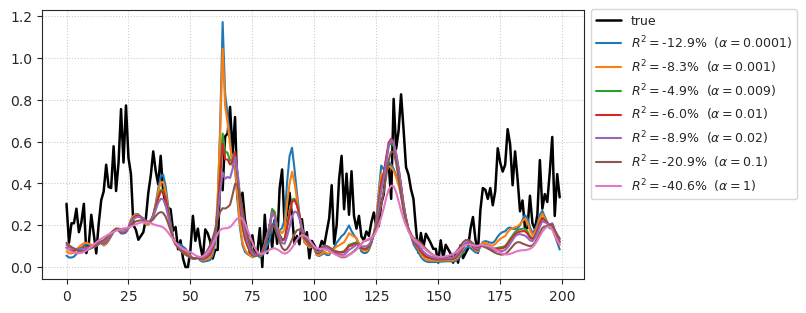

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 1)
r = {0.0001: 0.5610108812135699, 0.001: 0.5661362810686184, 0.009: 0.5993360273449515, 0.01: 
0.5993290540466701, 0.02: 0.5916026073476031, 0.1: 0.521127871835961, 1: 0.4882552140170544}

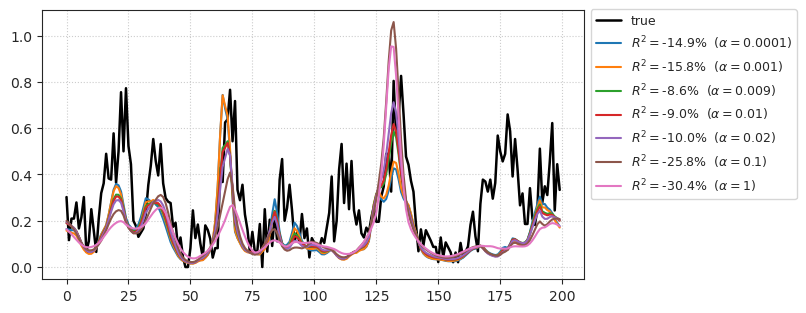

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 2)
r = {0.0001: 0.49037772144301595, 0.001: 0.49327004080001047, 0.009: 0.48281262459428065, 
0.01: 0.48191401772085074, 0.02: 0.48470001196103324, 0.1: 0.48518414367479407, 1: 
0.4713591571269766}

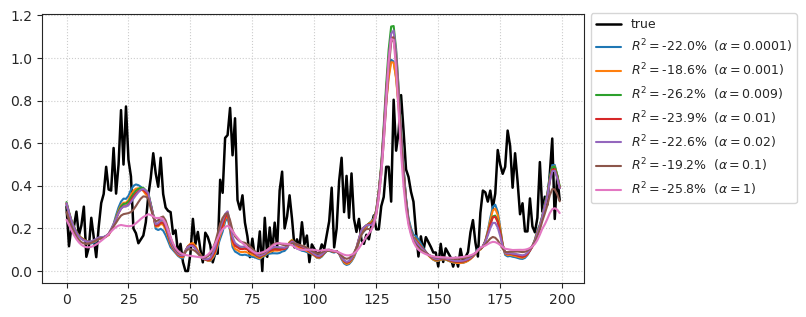

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 3)
r = {0.0001: 0.5268626745822543, 0.001: 0.534856467832975, 0.009: 0.5176899356281894, 0.01: 
0.5134614511278596, 0.02: 0.4766364831799201, 0.1: 0.4272079742404743, 1: 0.4313286830565419}

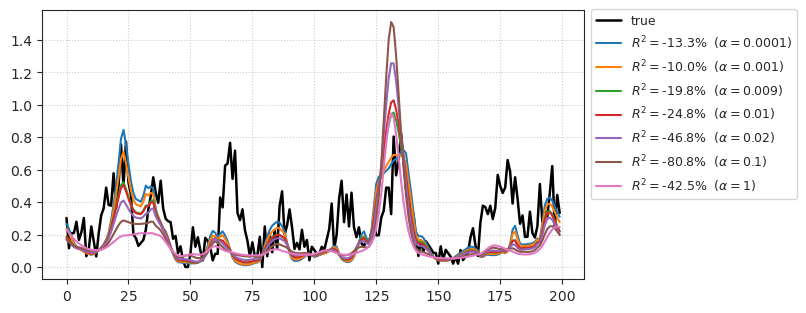

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 0)
r = {0.0001: 0.5358377604173328, 0.001: 0.5397089688120628, 0.009: 0.5484618636550824, 0.01: 
0.5464149170898529, 0.02: 0.5486723569967826, 0.1: 0.5735659515745866, 1: 0.5730688279448937}

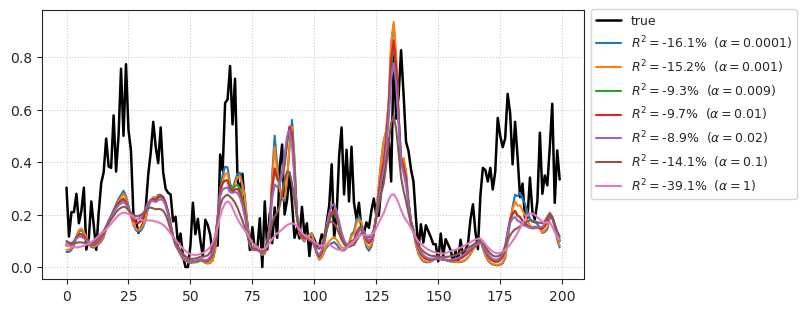

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 1)
r = {0.0001: 0.3026901964209535, 0.001: 0.3174134836543551, 0.009: 0.37821939501195057, 0.01:
0.3850275630974606, 0.02: 0.42412593801557563, 0.1: 0.5139440810301495, 1: 
0.5365212600975346}

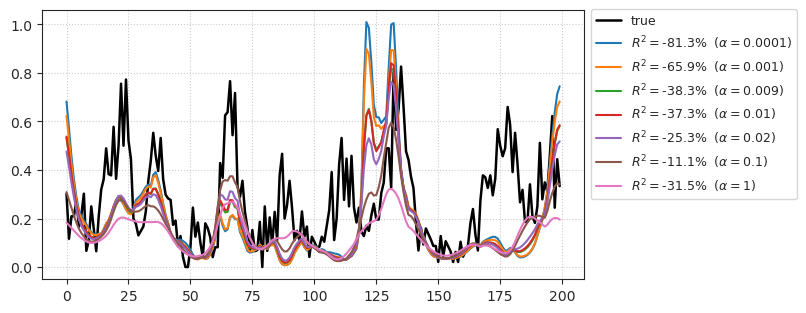

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 2)
r = {0.0001: 0.534612608638321, 0.001: 0.5136278317284501, 0.009: 0.5528348728662265, 0.01: 
0.55297955975906, 0.02: 0.555247392689942, 0.1: 0.5501176620765821, 1: 0.5404695018831001}

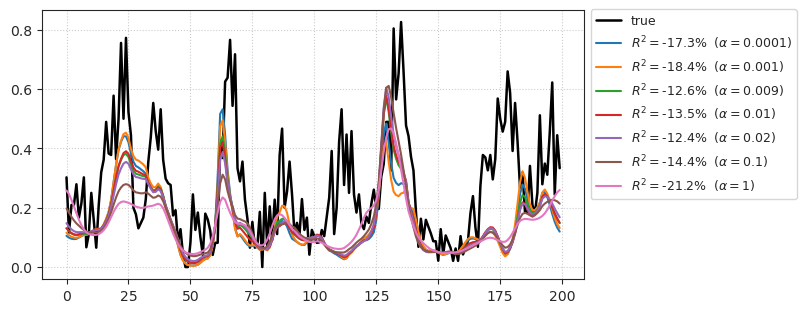

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 3)
r = {0.0001: 0.609353511673282, 0.001: 0.5777506698775623, 0.009: 0.5786623491086305, 0.01: 
0.5686309338623585, 0.02: 0.5535815320879127, 0.1: 0.5015322999541043, 1: 
0.45857533870996386}

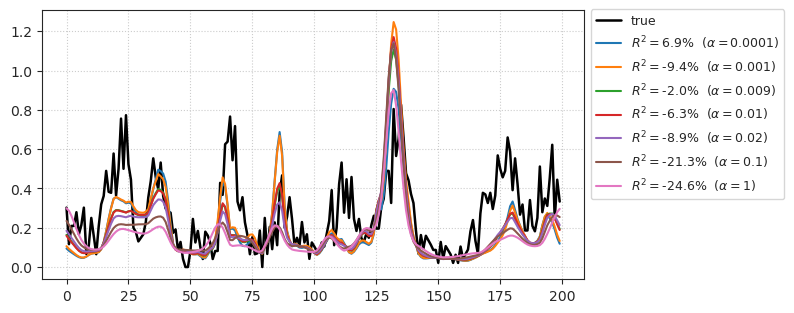

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 0)
r = {0.0001: 0.230512699312764, 0.001: 0.26961242237980054, 0.009: 0.3927540945075637, 0.01: 
0.3992028321650717, 0.02: 0.42676222390176116, 0.1: 0.5333882483594977, 1: 0.51362498827046}

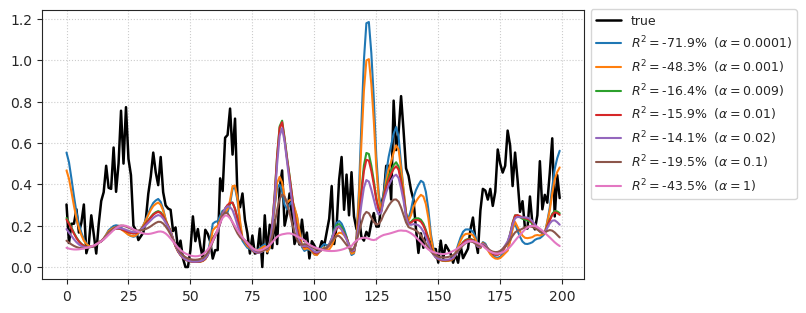

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 1)
r = {0.0001: 0.42540853597699657, 0.001: 0.4346717841908606, 0.009: 0.46660440066080733, 
0.01: 0.45983623868169554, 0.02: 0.47194081263065, 0.1: 0.4870138052652162, 1: 
0.4815703694909181}

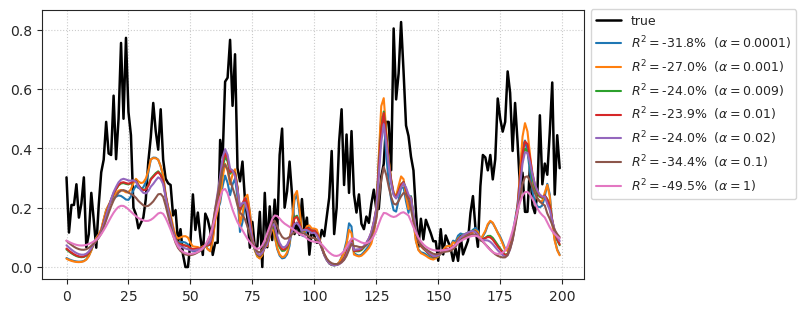

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 2)
r = {0.0001: 0.37233569141136813, 0.001: 0.3679425019913325, 0.009: 0.37501918078988494, 
0.01: 0.3879114988027934, 0.02: 0.38292927411281996, 0.1: 0.41621235622733277, 1: 
0.4838862668313342}

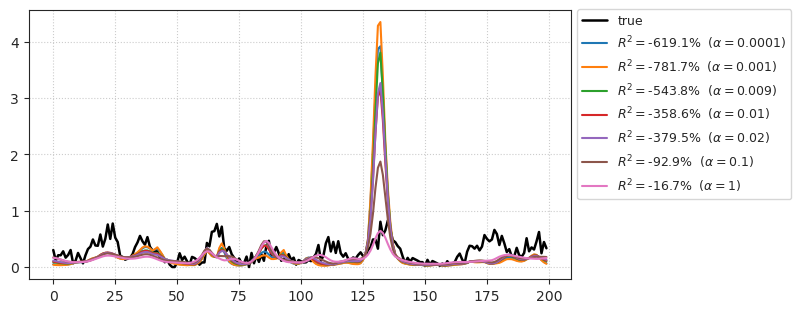

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 3)
r = {0.0001: 0.5560890225180906, 0.001: 0.5638810676302438, 0.009: 0.5481271308370067, 0.01: 
0.5468782637539249, 0.02: 0.5300070404894841, 0.1: 0.5021568230821167, 1: 0.4582181969901387}

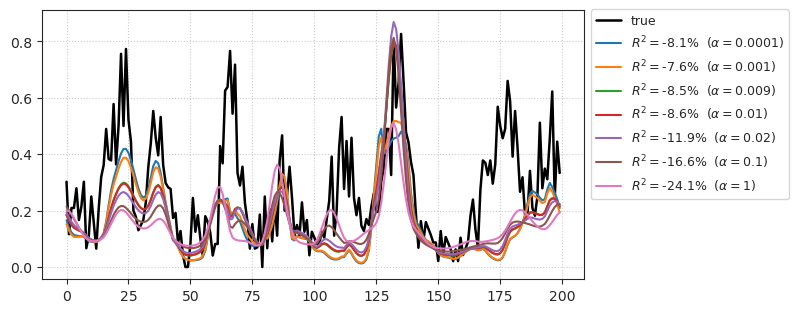

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

CPU times: user 2h 41min 36s, sys: 5min 16s, total: 2h 46min 52s
Wall time: 10min 5s


In [54]:
%%time

neuron_i = 0
lag = ro.best_lags[neuron_i]
inds = ro.good.copy()
inds = inds[inds > lag]

glm_kws = dict(
    category='PoissonRegressor',
    y=ro.spks[inds, neuron_i],
    y_tst=np.nanmean(ro.spks_r[neuron_i], 0),
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
results = np.zeros((4, 4))
for i, j in itertools.product(range(4), range(4)):
    glm_kws['x'] = ro.pcs[neuron_i].transform(ro.enc[..., i, j])[inds - lag]
    glm_kws['x_tst'] = ro.pcs[neuron_i].transform(ro.enc_r[..., i, j])[ro.good_r - lag]
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        glm = LinearModel(**glm_kws).fit(
            fit_df=False, max_iter=100)
    results[i, j] = max(glm.r_tst.values())
    print('-' * 80 + f"\n(i, j) = ({i}, {j})\nr = {glm.r_tst}")
    glm.show_pred()
    print('~' * 80)
    print('\n\n')

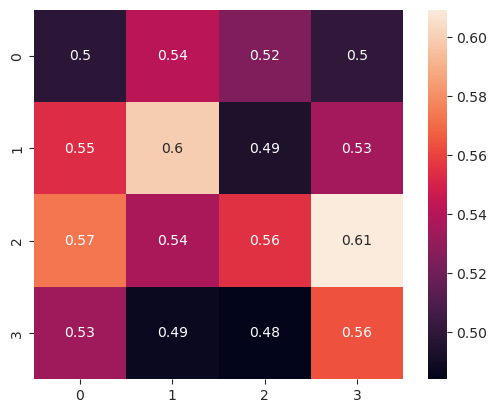

In [55]:
sns.heatmap(results, square=True, annot=True);

[(0, 3), (1, 3), (0, 2), (2, 3), (1, 2), (0, 1), (2, 2), (1, 1)]

(4, 4)

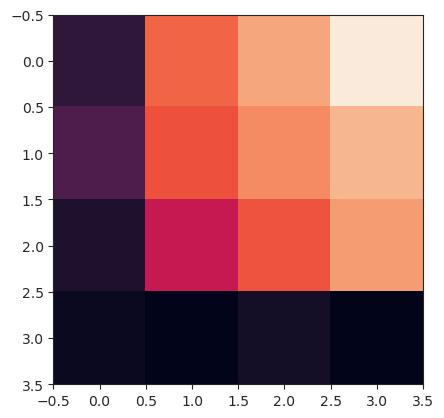

In [62]:
plt.imshow(ro.spatial[0])

In [6]:
best = ro.n_lags - np.argmax(ro.temporal)
worst = ro.n_lags - np.argmin(ro.temporal)
best, worst

(2, 23)

In [7]:
ro.best_pix_all[0, best], ro.best_pix_all[0, worst]

(array([1, 2]), array([2, 3]))

1.1559136

In [8]:
collections.Counter([
    tuple(a) for a in
    ro.best_pix_all[0]
]).most_common()

[((2, 3), 17), ((1, 2), 8), ((2, 2), 2)]

In [9]:
set([
    tuple(a) for a in
    ro.best_pix_all[0]
])

{(1, 2), (2, 2), (2, 3)}

In [11]:
pc = sk_decomp.PCA(n_components=500, svd_solver='full')
x = pc.fit_transform(np.concatenate([
    ro.enc[..., 1, 2],
    ro.enc[..., 2, 3],
], axis=-1))
x_r = pc.transform(np.concatenate([
    ro.enc_r[..., 1, 2],
    ro.enc_r[..., 2, 3],
], axis=-1))

x.shape, x_r.shape

((72000, 500), (613, 500))

In [12]:
_data = ro.get_data(0)

In [13]:
ro.best_lags

array([2])

In [14]:
%%time

inds = ro.good.copy()
inds = inds[inds > 2]

glm_kws = dict(
    x=x[inds - 2],
    x_tst=x_r[ro.good_r - 2],
    y=_data['y'],
    y_tst=_data['y_tst'],
    category='PoissonRegressor',
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{
    0.0001: 59.81718323972716,
    0.001: 60.32657916003596,
    0.009: 61.31369712833258,
    0.01: 62.126811847539564,
    0.02: 62.256836843683196,
    0.1: 65.24438029553087,
    1: 66.4456586506567
}

CPU times: user 13min 30s, sys: 41.1 s, total: 14min 11s
Wall time: 1min 20s


In [15]:
%%time

inds = ro.good.copy()
inds = inds[inds > 2]

glm_kws = dict(
    x=x[inds - 2],
    x_tst=x_r[ro.good_r - 2],
    y=_data['y'],
    y_tst=_data['y_tst'],
    category='PoissonRegressor',
    alphas=[2, 3],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{2: 64.52032343378144, 3: 62.90865093246507}

CPU times: user 3min 20s, sys: 10.2 s, total: 3min 30s
Wall time: 20.4 s


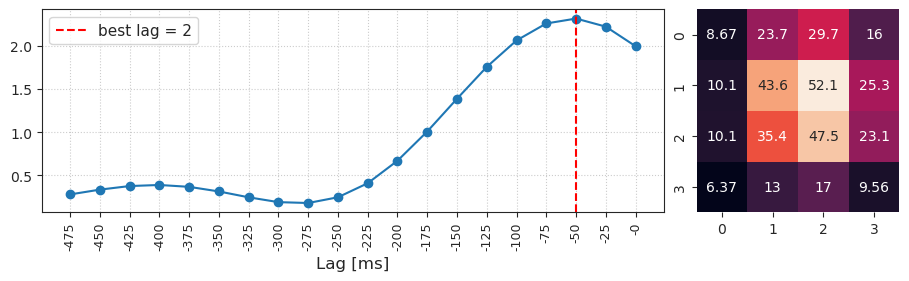

In [22]:
idx = 0
self= ro
best = []
for lag in range(20):
    norm = self.sta[idx][self.n_lags - lag]
    norm = np.mean(norm ** 2, axis=0)
    i, j = np.unravel_index(np.argmax(norm), norm.shape)
    best.append((i, j))

In [24]:
collections.Counter(best).most_common()

[((2, 3), 10), ((1, 2), 8), ((2, 2), 2)]

In [21]:
(best)

[(2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3),
 (2, 3)]

In [7]:
ro.sta.shape

(1, 20, 5312, 4, 4)

In [10]:
dims = (0, 1)
norm = ro.sta[0]
spatial = np.mean(norm ** 2, axis=dims)

<AxesSubplot:>

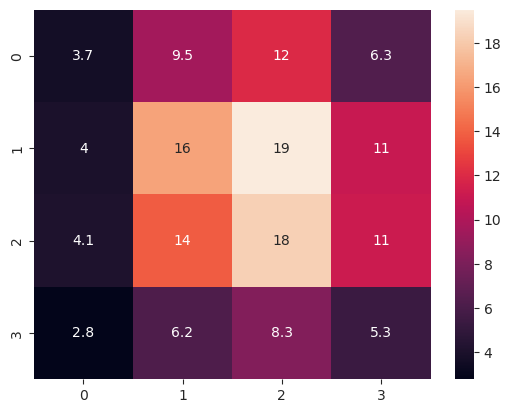

In [27]:
sns.heatmap(spatial * 1000, annot=True)

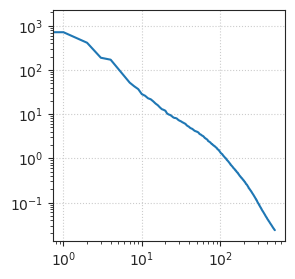

In [12]:
fig, ax = create_figure(1, 1, (3, 3))
ax.loglog(ro.pcs[0].explained_variance_)
ax.grid();

In [13]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{
    0.0001: 50.498639016050106,
    0.001: 51.81936195797998,
    0.009: 55.850880160036056,
    0.01: 56.42106521458003,
    0.02: 57.844973258492494,
    0.1: 63.16515083931511,
    1: 58.82579256648093
}

CPU times: user 4min 57s, sys: 74.6 ms, total: 4min 58s
Wall time: 11.6 s


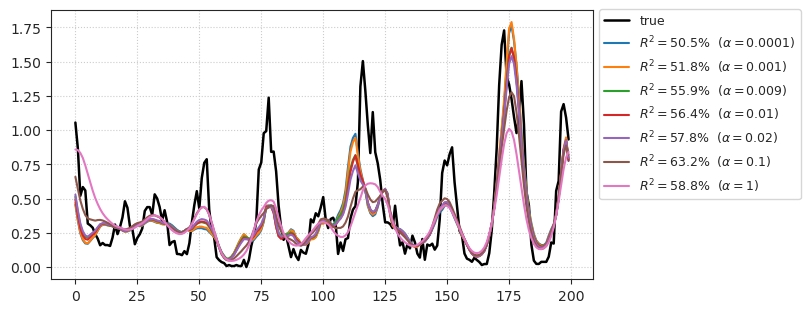

In [14]:
glm.show_pred();

## Old approach (looping over pixels)

In [10]:
from analysis.glm import prepare_data, push

In [11]:
expt = 'clu090'
kws_hf = dict(size=19, sres=1, radius=6)
stim, spks, good, stim_r, spks_r, good_r = prepare_data(
    expt=expt, tr=tr, kws_hf=kws_hf, rescale=2.25)
stim.shape, stim_r.shape

((72000, 2, 19, 19), (613, 2, 19, 19))

## Extract ftrs

In [12]:
kws_process = dict(scale=4, pool='max', act_fn='swish')

enc = push(tr, stim, kws_process)
enc_r = push(tr, stim_r, kws_process)
enc.shape, enc_r.shape

((72000, 5312, 4, 4), (613, 5312, 4, 4))

In [13]:
mu, sd = enc.mean(), enc.std()

enc_r = (enc_r - mu) / sd
enc = (enc - mu) / sd

print(f"(before) - - - \t mu: {mu}, sd: {sd}")

(before) - - -   mu: 0.0299233365803957, sd: 0.10497088730335236

In [16]:
%%time

x = np.zeros((len(enc), 500, 4, 4))
x_r = np.zeros((len(enc_r), 500, 4, 4))

for i, j in itertools.product(range(4), range(4)):
    pc = sk_decomp.PCA(n_components=500, svd_solver='full')
    x[..., i, j] = pc.fit_transform(enc[..., i, j])
    x_r[..., i, j] = pc.transform(enc_r[..., i, j])

CPU times: user 1h 49min 20s, sys: 4min 5s, total: 1h 53min 25s
Wall time: 6min 41s


--------------------------------------------------------------------------------
(i, j) = (0, 0), r2:
{0.0001: 33.71971015159151, 0.001: 36.633552475976984, 0.009: 49.17995183459001, 0.01: 
48.992568200724484, 0.02: 53.00993164855434, 0.1: 50.65623263913517, 1: 34.00000197567766}

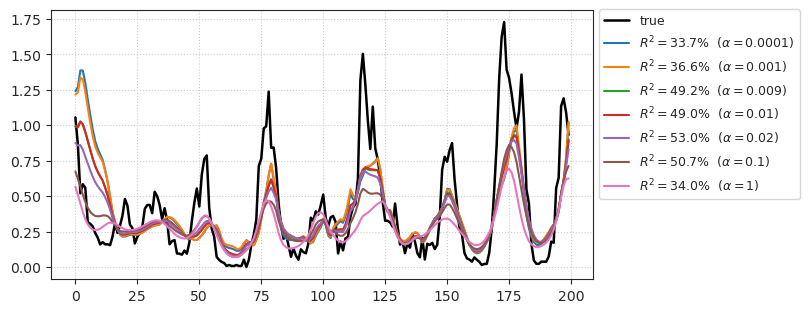

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 1), r2:
{0.0001: 66.40940599941074, 0.001: 65.85325829729133, 0.009: 67.09518014113951, 0.01: 
65.89558546722867, 0.02: 65.48212589911202, 0.1: 62.47955803612921, 1: 53.61921869171064}

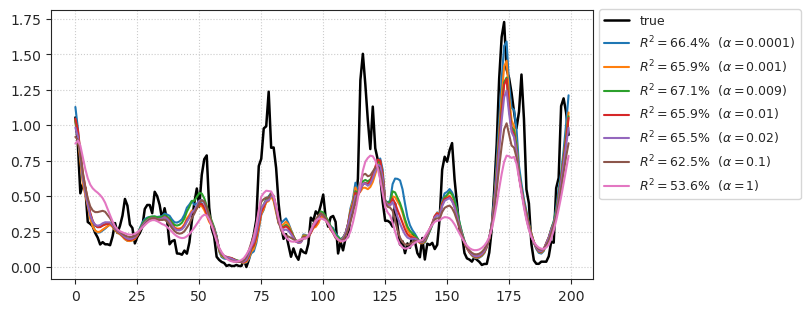

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 2), r2:
{0.0001: 47.68527316457395, 0.001: 49.22642103325392, 0.009: 54.54893499228635, 0.01: 
55.99763257811976, 0.02: 58.967706913357354, 0.1: 65.0006352205612, 1: 59.58700460939522}

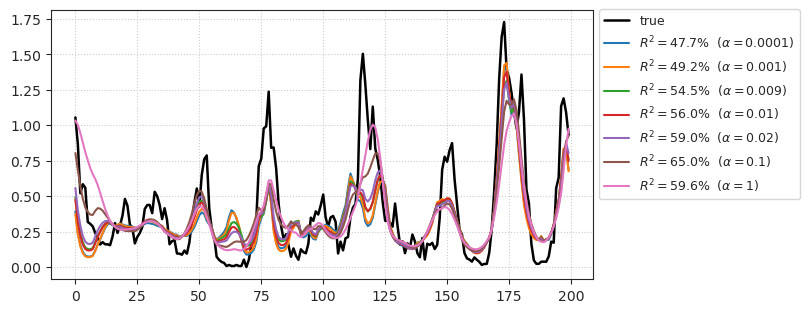

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (0, 3), r2:
{0.0001: 69.96344294653639, 0.001: 67.49468651945998, 0.009: 67.88972395042423, 0.01: 
65.87575127428347, 0.02: 65.16477048996899, 0.1: 65.80421959316536, 1: 60.75387115400637}

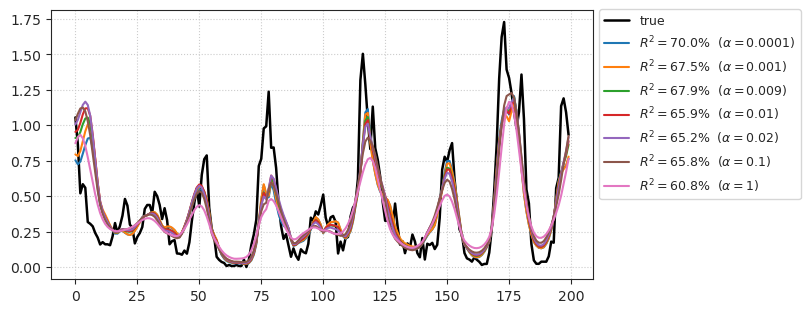

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 0), r2:
{0.0001: 51.81231639759124, 0.001: 52.37192365613505, 0.009: 56.403318523497134, 0.01: 
56.08304256418699, 0.02: 57.00714292214622, 0.1: 55.344239805073215, 1: 46.16294235896389}

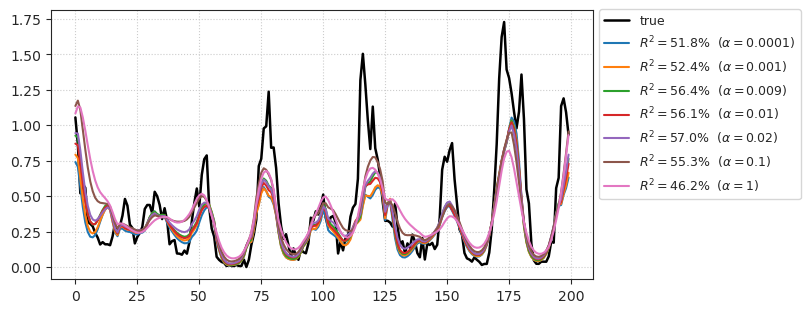

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 1), r2:
{0.0001: 68.17753138069872, 0.001: 68.8129576380744, 0.009: 68.8863773779709, 0.01: 
68.41953315241156, 0.02: 68.60947757565566, 0.1: 64.9588553876784, 1: 56.15120080198811}

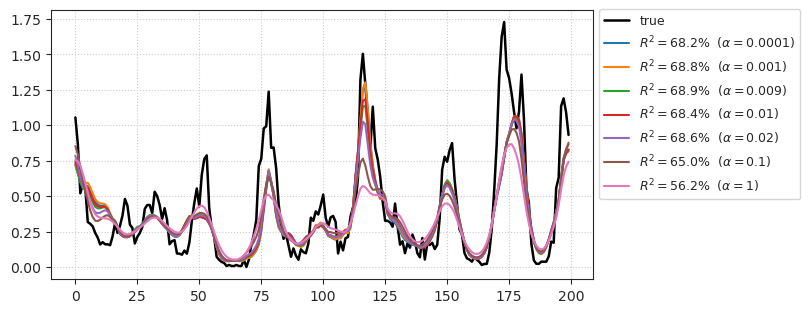

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 2), r2:
{0.0001: 50.498639016050106, 0.001: 51.81936195797998, 0.009: 55.850880160036056, 0.01: 
56.42106521458003, 0.02: 57.844973258492494, 0.1: 63.16515083931511, 1: 58.82579256648093}

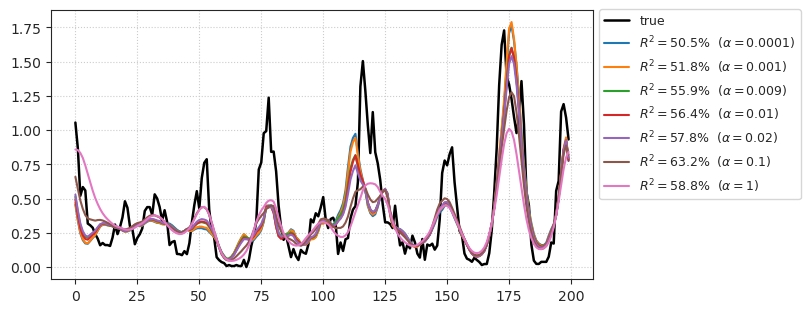

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (1, 3), r2:
{0.0001: 62.08069706312504, 0.001: 60.66915583355197, 0.009: 63.887121680131955, 0.01: 
64.39467637064706, 0.02: 64.87881334500482, 0.1: 59.25019014045885, 1: 53.35950436339295}

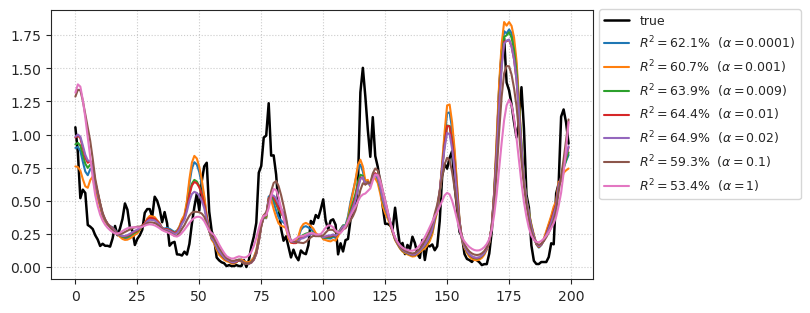

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 0), r2:
{0.0001: 40.721281425740145, 0.001: 36.69249316163244, 0.009: 40.77395104319328, 0.01: 
39.849845607099034, 0.02: 41.79279995787526, 0.1: 43.90669128037808, 1: 39.602418839242674}

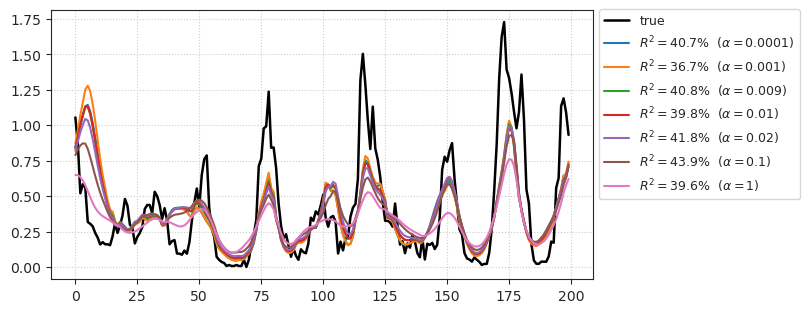

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 1), r2:
{0.0001: 67.4717086478926, 0.001: 68.0571776168735, 0.009: 65.41935926951619, 0.01: 
66.06067418237258, 0.02: 64.18080976434922, 0.1: 58.1302224965944, 1: 51.346417201584885}

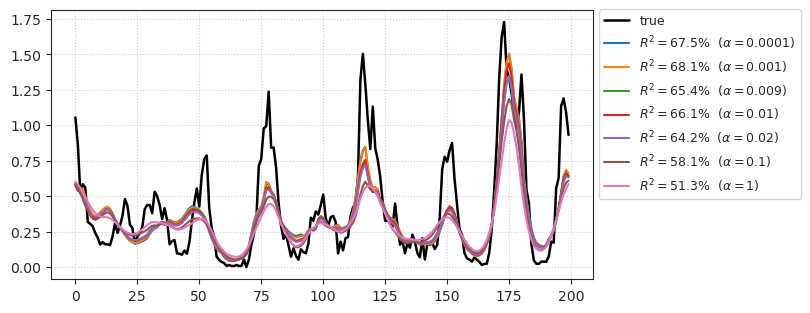

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 2), r2:
{0.0001: 60.776633440045714, 0.001: 61.702601516138024, 0.009: 63.90273658245131, 0.01: 
62.98943983836838, 0.02: 66.3692367731364, 0.1: 68.5439329229617, 1: 61.57525495389356}

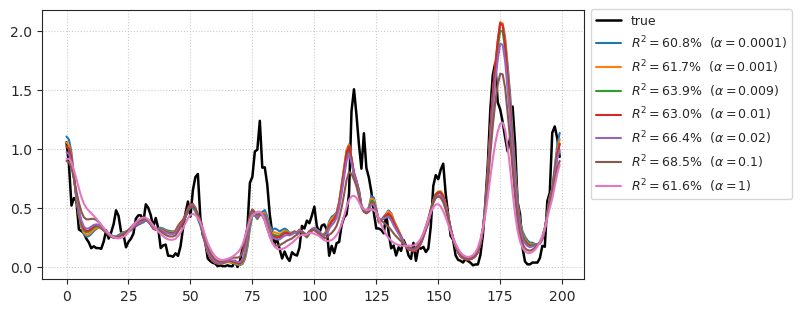

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (2, 3), r2:
{0.0001: 71.00339682681474, 0.001: 71.25099242388694, 0.009: 71.88164953637882, 0.01: 
72.02709335918784, 0.02: 71.80693910862614, 0.1: 68.21239130831177, 1: 59.87759377600238}

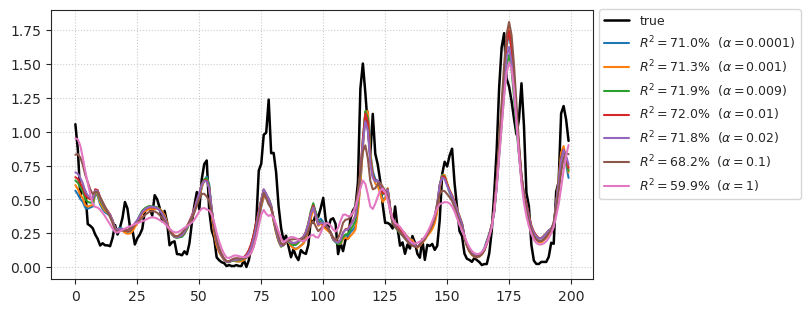

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 0), r2:
{0.0001: 50.11294032266142, 0.001: 50.7804444232776, 0.009: 53.07454724273395, 0.01: 
52.96049817856805, 0.02: 52.98807996795796, 0.1: 49.05838045778695, 1: 32.16698262280756}

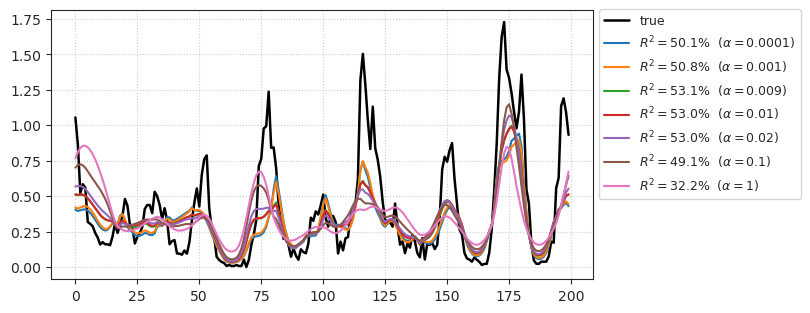

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 1), r2:
{0.0001: 51.669683616689554, 0.001: 55.660527303261595, 0.009: 60.41791152702702, 0.01: 
61.2434361413548, 0.02: 62.252099950934124, 0.1: 59.611213408447206, 1: 41.857848763887986}

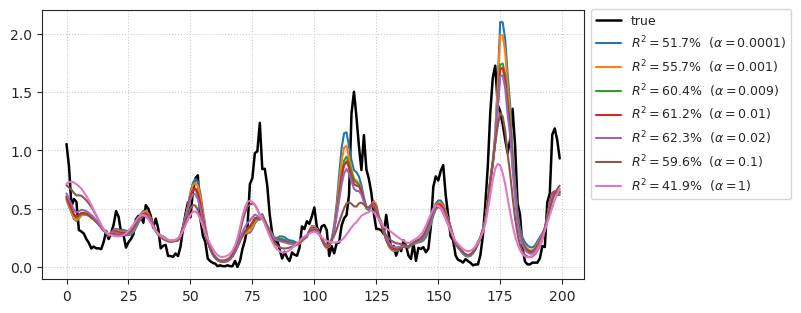

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 2), r2:
{0.0001: 59.64911120765804, 0.001: 58.20967917016846, 0.009: 61.041515302357354, 0.01: 
60.912589817993144, 0.02: 62.33202569893874, 0.1: 60.29125869117187, 1: 51.08704851166572}

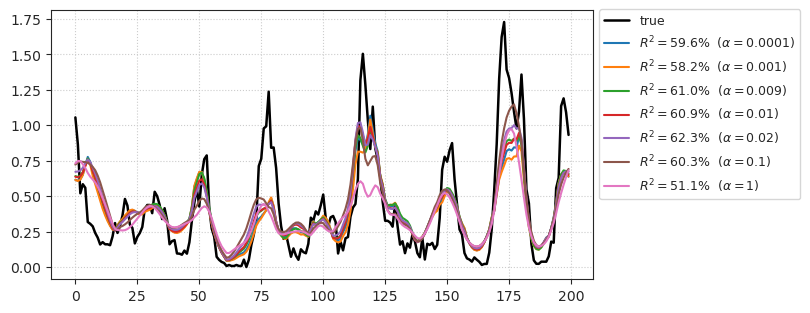

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--------------------------------------------------------------------------------
(i, j) = (3, 3), r2:
{0.0001: 60.135605082285814, 0.001: 58.6728306132285, 0.009: 61.31545668372189, 0.01: 
61.322674459256376, 0.02: 60.68358450426927, 0.1: 58.11133822793478, 1: 46.61281107416579}

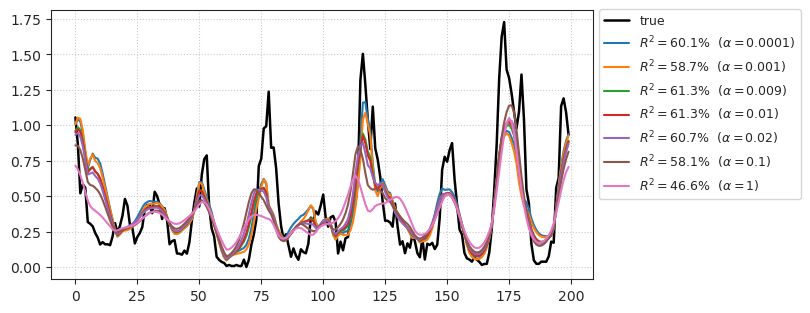

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

CPU times: user 1h 15min 53s, sys: 993 ms, total: 1h 15min 54s
Wall time: 3min 4s


In [23]:
%%time

neuron_i = 0
lag = ro.best_lags[neuron_i]
inds = ro.good.copy()
inds = inds[inds > lag]

glm_kws = dict(
    category='PoissonRegressor',
    y=ro.spks[inds, neuron_i],
    y_tst=np.nanmean(ro.spks_r[neuron_i], 0),
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
results = np.zeros((4, 4))
for i, j in itertools.product(range(4), range(4)):
    glm_kws['x'] = x[inds - lag, ..., i, j]
    glm_kws['x_tst'] = x_r[ro.good_r - lag, ..., i, j]
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        glm = LinearModel(**glm_kws).fit(
            fit_df=False, max_iter=100)
    results[i, j] = max(glm.r2_tst.values())
    print('-' * 80 + f"\n(i, j) = ({i}, {j}), r2:\n{glm.r2_tst}")
    glm.show_pred()
    print('~' * 80)
    print('\n\n')

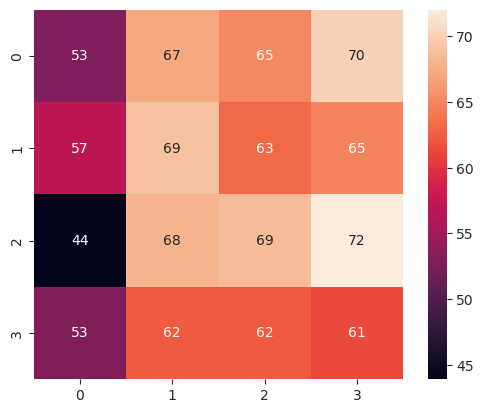

In [25]:
sns.heatmap(results, square=True, annot=True);

We see that indeed pixel (2, 3) is best.

## What if I reduce the number of lags?

In [26]:
%%time

ro = ReadoutGLM('clu090', tr, n_lags=11, verbose=False).fit()

CPU times: user 10min 35s, sys: 44.8 s, total: 11min 20s
Wall time: 4min 36s


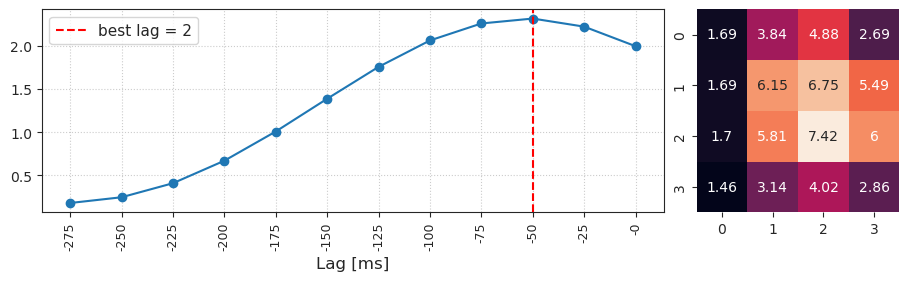

In [27]:
ro.show(0)

In [28]:
%%time

glm_kws = dict(
    **ro.get_data(0),
    category='PoissonRegressor',
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    glm = LinearModel(**glm_kws).fit(
        fit_df=False, max_iter=100)
print(glm.r2_tst)

{
    0.0001: 60.776633440045714,
    0.001: 61.702601516138024,
    0.009: 63.90273658245131,
    0.01: 62.98943983836838,
    0.02: 66.3692367731364,
    0.1: 68.5439329229617,
    1: 61.57525495389356
}

CPU times: user 4min 49s, sys: 79.4 ms, total: 4min 49s
Wall time: 11.3 s


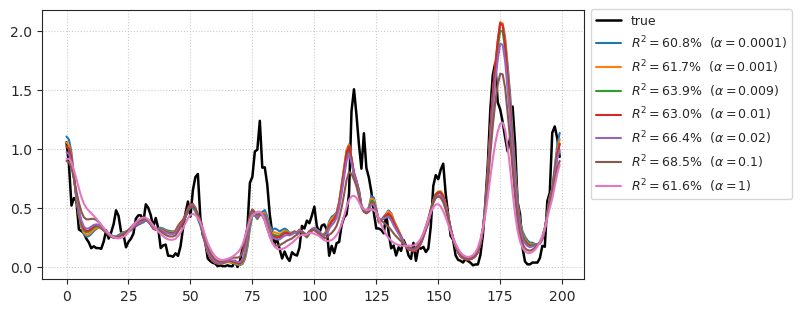

In [29]:
glm.show_pred();

## STA

In [7]:
lags = 19
sta = compute_sta(
    lags=lags,
    good=good,
    stim=enc,
    spks=spks,
    zscore=True,
    verbose=True,
)
sta.shape

100%|████████████████████████████████████| 54386/54386 [04:58<00:00, 182.12it/s]


(1, 20, 5312, 4, 4)

In [8]:
sta.mean(), sta.std()

(0.013820175577658455, 0.09660381682004616)

In [ ]:
def _best_lag(sta):
    dims = (2, 3, 4)
    norm = np.mean(sta ** 2, axis=dims)
    best_lags = np.argmax(norm[:, ::-1], axis=1)

In [9]:
dims = (2, 3, 4)
norm = np.mean(sta ** 2, axis=dims)
best_lag = np.argmax(norm[:, ::-1], axis=1)
norm.shape

(1, 20)

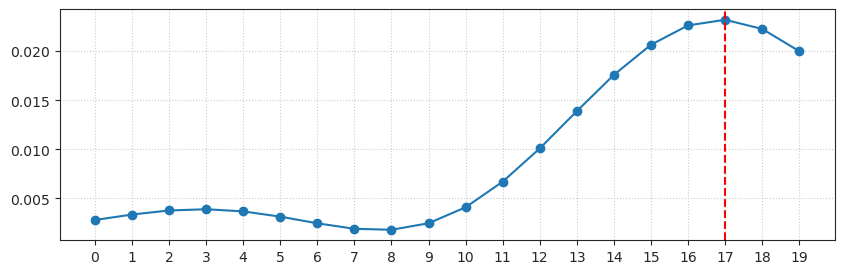

In [11]:
best_lag

array([2])

In [12]:
dims = (1, 2)
norm = sta[0][best_lag[0]]
norm = np.mean(norm ** 2, axis=dims)

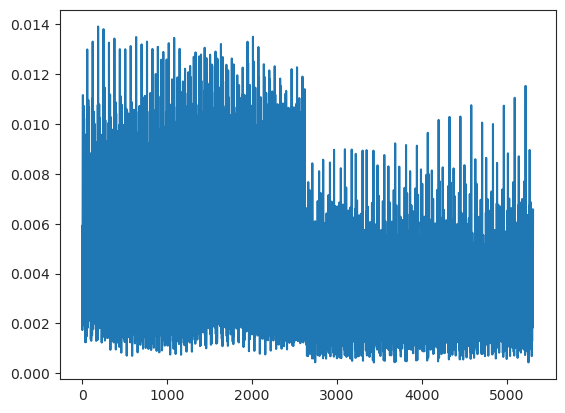

In [13]:
plt.plot(norm);

In [14]:
best_filts = np.argsort(norm)[::-1]
best_filts[0]

188

In [14]:
# was use_ema=True, and float

232

In [15]:
dims = (0,)
norm = sta[0][best_lag[0]]
norm = np.mean(norm ** 2, axis=dims)
best_i, best_j = np.unravel_index(np.argmax(norm), norm.shape)
best_i, best_j

(2, 3)

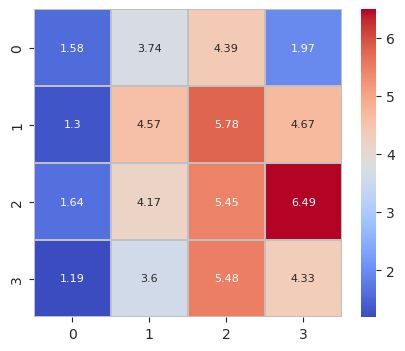

In [16]:
show_heatmap(norm * 1000, cmap='coolwarm', vmin=None, vmax=None, fmt='1.3g', figsize=(5, 4));

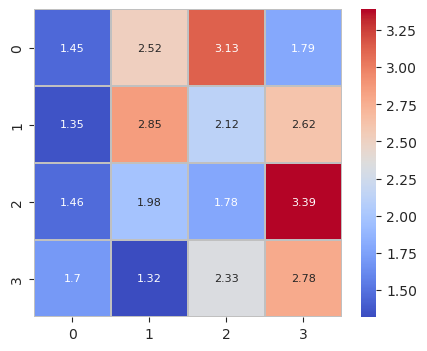

In [16]:
# was use_ema=True, and float

In [17]:
neuron_i = 0

idxs = good.copy()
idxs = idxs[idxs > best_lag[neuron_i]]

x = enc[idxs - best_lag[0], :, best_i, best_j]
x_r = enc_r[good_r - best_lag[0], :, best_i, best_j]

mu = x.mean(0, keepdims=True)
sd = x.std(0, keepdims=True)

x = (x - mu) / sd
x_r = (x_r - mu) / sd

x.shape, x_r.shape

((54386, 5312), (200, 5312))

In [34]:
%%time

top_n = 2000

glm_kws = dict(
    category='PoissonRegressor',
    x=x[:, best_filts[:top_n]],
    y=spks[idxs, neuron_i],
    x_tst=x_r[:, best_filts[:top_n]],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.01, 0.1, 1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=100)
print(glm.r2_tst)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


{0.01: 67.81078848789481, 0.1: 66.03015024484039, 1: 56.72751291463764}

CPU times: user 10min 30s, sys: 54.4 s, total: 11min 24s
Wall time: 3min 16s


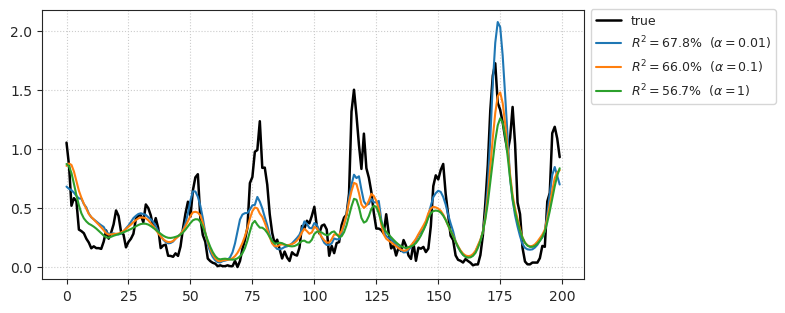

In [35]:
glm.show_pred();

In [36]:
%%time

glm_kws = dict(
    category='PoissonRegressor',
    x=x,
    y=spks[idxs, neuron_i],
    x_tst=x_r,
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.01, 0.1, 1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=100)
print(glm.r2_tst)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


{0.01: 61.91076973308524, 0.1: 67.39435265392588, 1: 65.15033758386559}

CPU times: user 23min 31s, sys: 3min 4s, total: 26min 35s
Wall time: 6min 2s


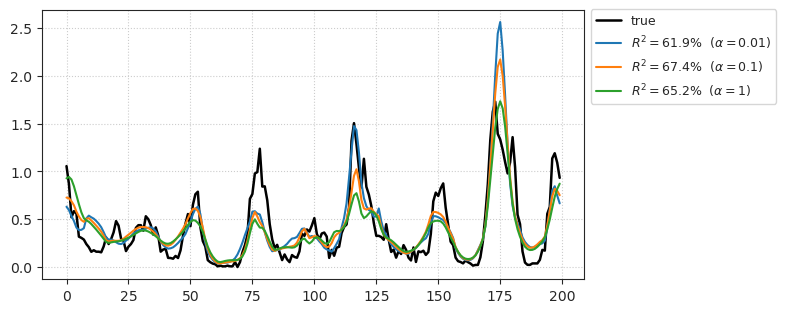

In [37]:
glm.show_pred();

In [39]:
c = glm.models[0.1].coef_

In [40]:
c.shape

(5312,)

In [44]:
u, s, v = sp_lin.svd(sta[0, ..., best_i, best_j])

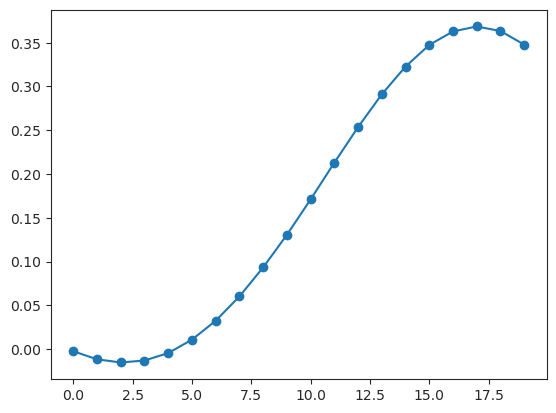

In [47]:
plt.plot(u[:, 0], marker='o')

In [50]:
sp_stats.pearsonr(c, v[0])

(0.15788671850852828, 5.370692816528103e-31)

In [68]:
test = sk_linear.PoissonRegressor(alpha=0.1, warm_start=True)
test.coef_ = v[0] / 10
test.intercept_ = 0

In [69]:
test.fit(x, spks[idxs, neuron_i])
pred = test.predict(x_r)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


In [70]:
sk_metric.r2_score(glm_kws['y_tst'], pred) * 100

68.66322806846182

## Fit using 10 lags

In [78]:
dims = (1, 2)
norm = np.mean(sta ** 2, axis=dims)
best_i, best_j = np.unravel_index(np.argmax(norm[0]), norm[0].shape)
best_i, best_j

(1, 2)

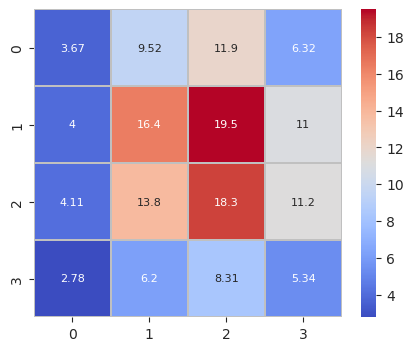

In [79]:
show_heatmap(norm[0] * 1000, cmap='coolwarm', vmin=None, vmax=None, fmt='1.3g', figsize=(5, 4));

In [81]:
src = time_embed(enc[..., best_i, best_j], lags=12, idxs=good)
src_r = time_embed(enc_r[..., best_i, best_j], lags=12, idxs=good_r)

mu = src.mean(0, keepdims=True)
sd = src_r.std(0, keepdims=True)

src = (src - mu) / sd
src_r = (src_r - mu) / sd

src.shape, src_r.shape

((54386, 12, 5312), (200, 12, 5312))

In [82]:
%%time

glm_kws = dict(
    category='PoissonRegressor',
    x=src,
    y=spks[idxs, neuron_i],
    x_tst=src_r,
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[0.01, 0.1, 1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=50)
print(glm.r2_tst)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{0.01: 50.01689322998719, 0.1: 57.019483255533984, 1: 58.608831254233976}

CPU times: user 2h 6min 45s, sys: 18min 27s, total: 2h 25min 13s
Wall time: 35min 19s


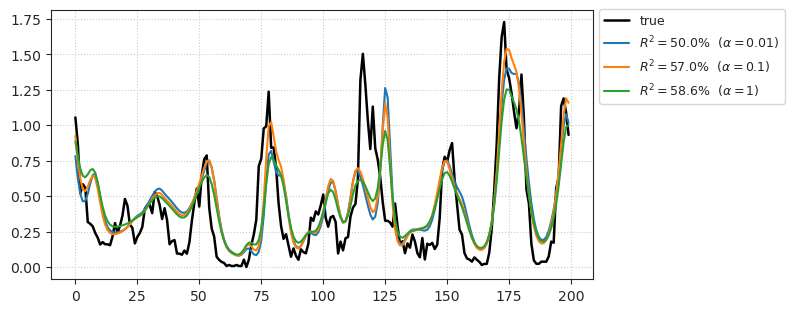

In [83]:
glm.show_pred();

## loop

In [84]:
dims = (0,)
norm = sta[0][best_lag[0]]
norm = np.mean(norm ** 2, axis=dims)
best_i, best_j = np.unravel_index(np.argmax(norm), norm.shape)
best_i, best_j

(2, 3)

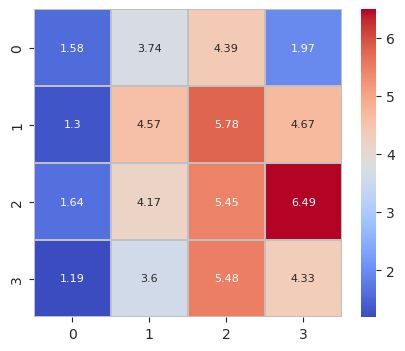

In [85]:
show_heatmap(norm * 1000, cmap='coolwarm', vmin=None, vmax=None, fmt='1.3g', figsize=(5, 4));

In [86]:
neuron_i = 0

idxs = good.copy()
idxs = idxs[idxs > best_lag[neuron_i]]

x = enc[idxs - best_lag[0], :, best_i, best_j]
x_r = enc_r[good_r - best_lag[0], :, best_i, best_j]

mu = x.mean(0, keepdims=True)
sd = x.std(0, keepdims=True)

x = (x - mu) / sd
x_r = (x_r - mu) / sd

x.shape, x_r.shape

((54386, 5312), (200, 5312))

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


{
    0.0001: 13.874520845896088,
    0.001: 14.700837437217773,
    0.01: 16.143970499406358,
    0.1: 16.448197514513364,
    1: 10.992996729038351
}

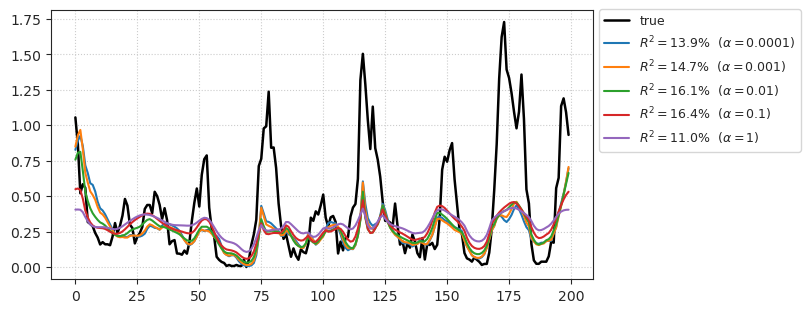

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


{
    0.0001: 25.226019334068507,
    0.001: 25.558388428738898,
    0.01: 26.641126535922986,
    0.1: 24.295765873406694,
    1: 14.964383607771282
}

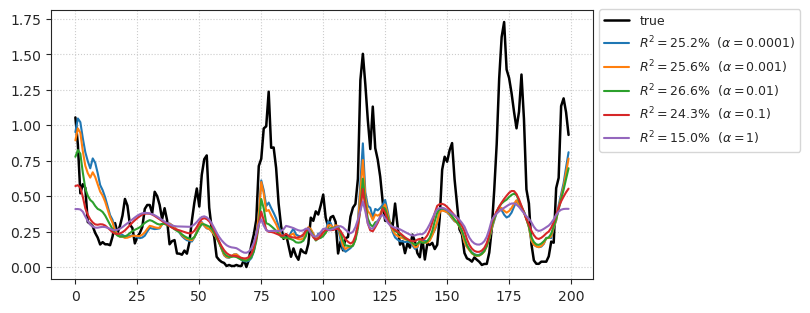

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 55.139510082665645,
    0.001: 51.82783745246584,
    0.01: 44.69914771257702,
    0.1: 39.63243276877684,
    1: 34.82751974238298
}

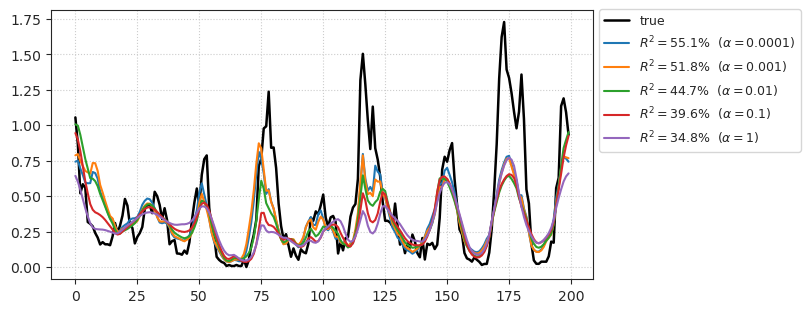

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 38.927205868760154,
    0.001: 52.20576627599207,
    0.01: 61.8936770453951,
    0.1: 56.703715444244715,
    1: 45.866078671280206
}

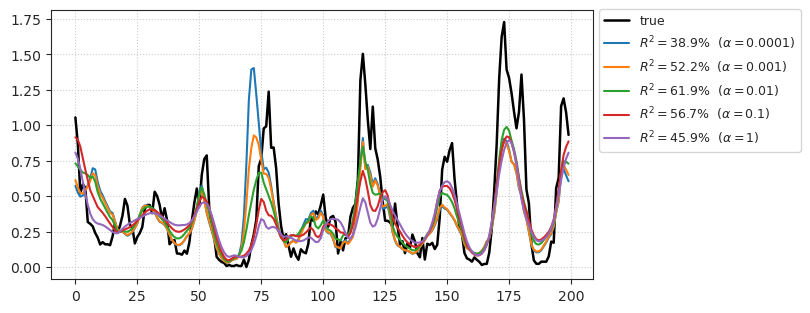

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 68.372718339321,
    0.001: 65.56953008227306,
    0.01: 69.86349604383962,
    0.1: 62.37911245523867,
    1: 52.0711998582472
}

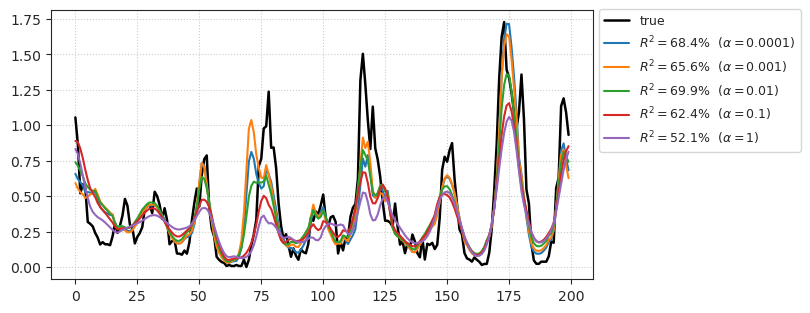

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 44.341012617224095,
    0.001: 42.99515790493034,
    0.01: 67.81078848789481,
    0.1: 66.03015024484039,
    1: 56.72751291463764
}

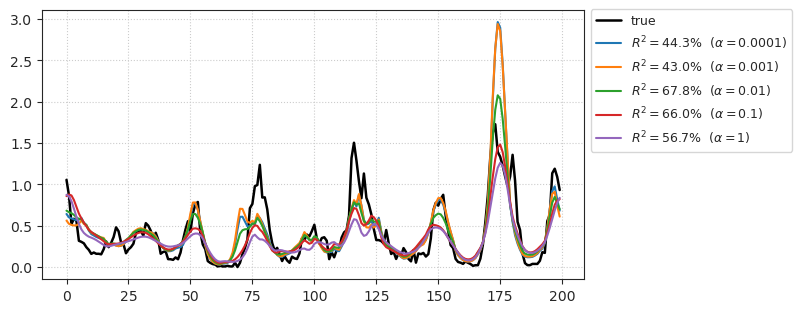

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 61.54865484934249,
    0.001: 59.32527148380377,
    0.01: 66.15131345769296,
    0.1: 67.41017319315459,
    1: 59.12565579044078
}

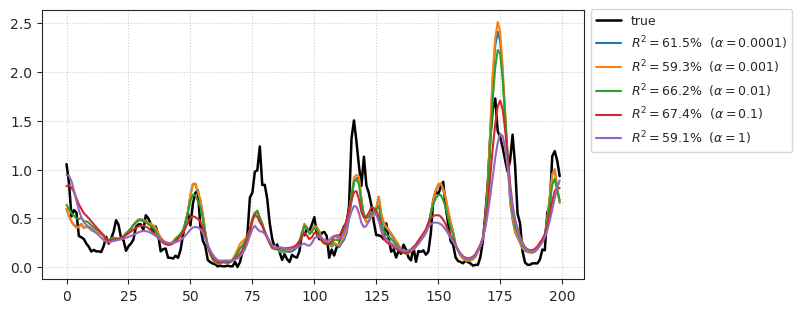

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 60.7107180118788,
    0.001: 59.098270590842915,
    0.01: 64.52340692413553,
    0.1: 67.33088804560656,
    1: 60.85791762791176
}

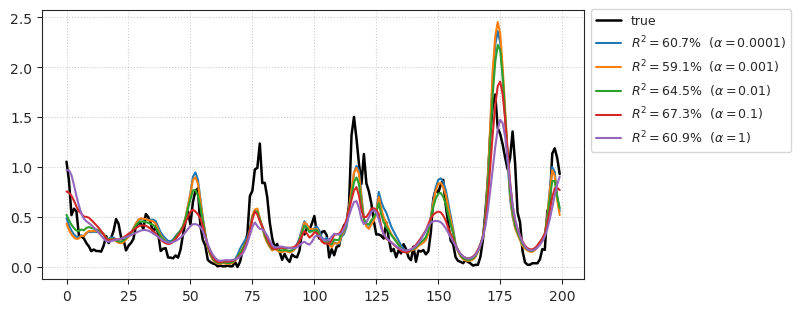

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 56.973811671377206,
    0.001: 64.4908842763473,
    0.01: 63.444397528916326,
    0.1: 67.36169502824548,
    1: 62.35269475616163
}

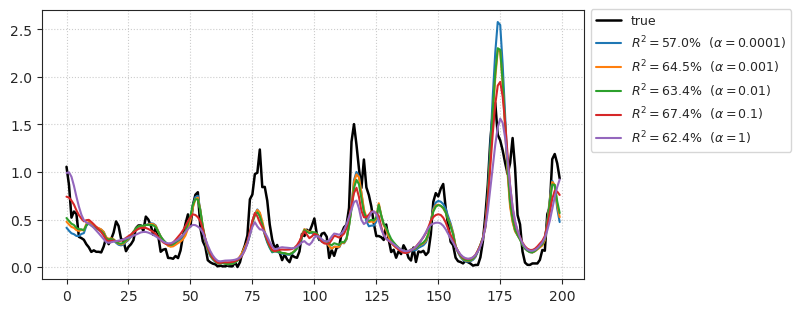

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 55.25518599459238,
    0.001: 55.17967263890926,
    0.01: 57.9989287186994,
    0.1: 66.05970517189273,
    1: 62.85388720904478
}

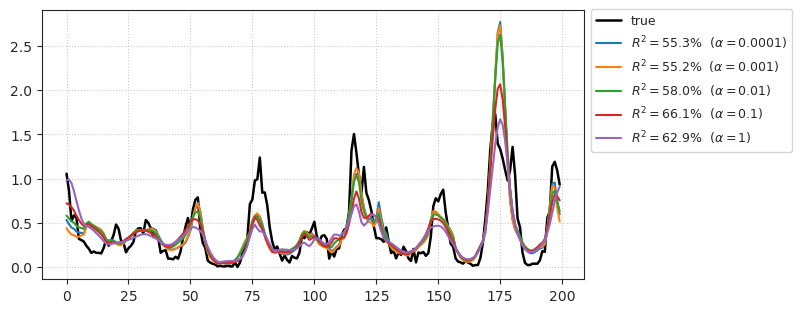

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 63.26886829645942,
    0.001: 60.5130059560077,
    0.01: 64.53777072600084,
    0.1: 66.71205553214473,
    1: 64.86583810280146
}

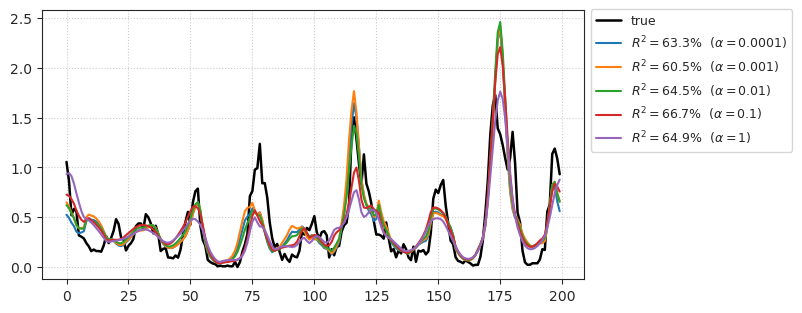

CPU times: user 3h 31min 54s, sys: 19min 19s, total: 3h 51min 14s
Wall time: 1h 9min 54s


In [87]:
%%time

for top_n in [50, 100, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 5000]:
    glm_kws = dict(
        category='PoissonRegressor',
        x=x[:, best_filts[:top_n]],
        y=spks[idxs, neuron_i],
        x_tst=x_r[:, best_filts[:top_n]],
        y_tst=np.nanmean(spks_r[neuron_i], 0),
        alphas=[1e-4, 1e-3, 1e-2, 1e-1, 1],
    )
    glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=100)
    print(glm.r2_tst)
    glm.show_pred();

## PCA

In [88]:
dims = (2, 3, 4)
temporal = np.mean(sta ** 2, axis=dims)
best_lag = np.argmax(temporal[:, ::-1], axis=1)
temporal.shape

(1, 20)

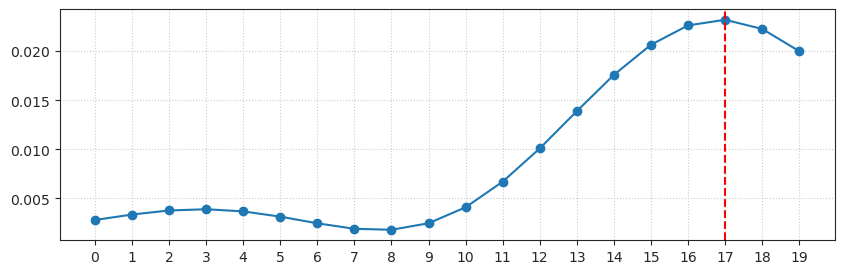

In [89]:
fig, ax = create_figure(1, 1, (10, 3))
ax.plot(temporal[0], marker='o')
plt.axvline(lags - best_lag[0], color='r', ls='--')
ax.locator_params(axis='x', nbins=lags * 1.2)
ax.grid()

In [90]:
best_lag

array([2])

In [91]:
dims = (1, 2)
filters = sta[0][best_lag[0]]
filters = np.mean(filters ** 2, axis=dims)

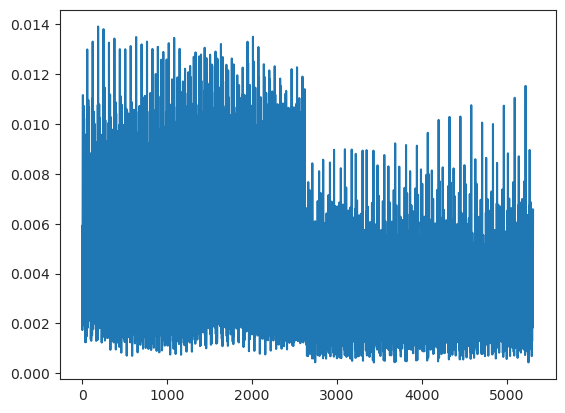

In [92]:
plt.plot(filters);

In [93]:
best_filts = np.argsort(filters)[::-1]
best_filts[0]

188

In [94]:
dims = (0,)
spatial = sta[0][best_lag[0]]
spatial = np.mean(spatial ** 2, axis=dims)
best_i, best_j = np.unravel_index(
    np.argmax(spatial), spatial.shape)
best_i, best_j

(2, 3)

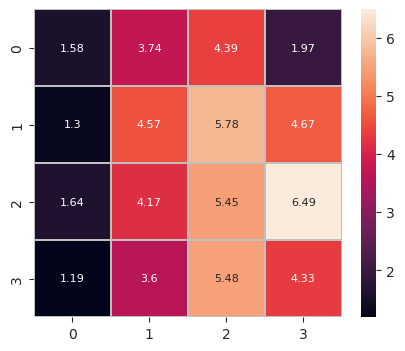

In [181]:
show_heatmap(spatial * 1000, cmap='rocket', vmin=None, vmax=None, fmt='1.3g', figsize=(5, 4));

In [97]:
enc[..., best_i, best_j].shape

(72000, 5312)

In [ ]:
u, s, v = sp_lin.svd(enc[..., best_i, best_j], full_matrices=False)

In [239]:
pc = PCA(n_components=500, svd_solver='full')
x_transformed = pc.fit_transform(enc[..., best_i, best_j])
x_r_transformed = pc.transform(enc_r[..., best_i, best_j])

x_transformed.shape, x_r_transformed.shape

((72000, 500), (613, 500))

In [240]:
sum(pc.explained_variance_ratio_) ** 2 / sum(pc.explained_variance_ratio_ ** 2)

6.0554219509414136

In [217]:
# was with n_components=500

6.0554219509414136

#### PCA without z score

In [241]:
%%time

idxs = good.copy()
idxs = idxs[idxs > best_lag[neuron_i]]

glm_kws = dict(
    category='PoissonRegressor',
    x=x_transformed[idxs - best_lag[0]],
    y=spks[idxs, neuron_i],
    x_tst=x_r_transformed[good_r - best_lag[0]],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1e-4, 1e-3, 9e-3, 1e-2, 2e-2, 1e-1, 1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=100)
print(glm.r2_tst)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (m

{
    0.0001: 70.92738274623802,
    0.001: 70.91961880409056,
    0.009: 71.78837312366868,
    0.01: 71.9822803383262,
    0.02: 71.33229439304593,
    0.1: 68.20872891676531,
    1: 59.87367769760792
}

CPU times: user 13min 11s, sys: 40.8 s, total: 13min 51s
Wall time: 1min 21s


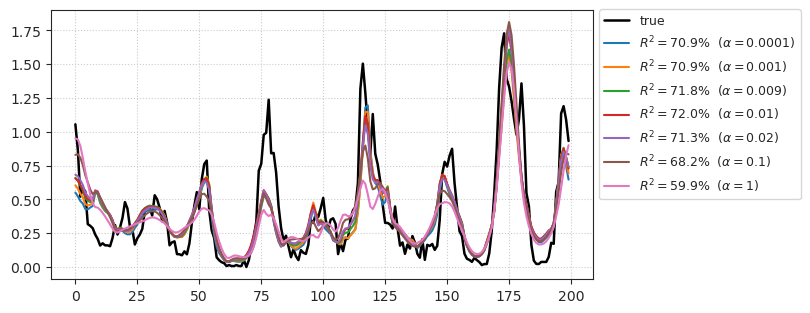

In [242]:
glm.show_pred();

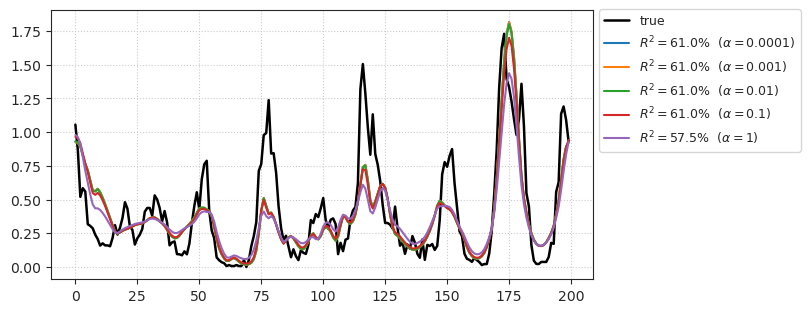

In [238]:
# was with 100 PC components

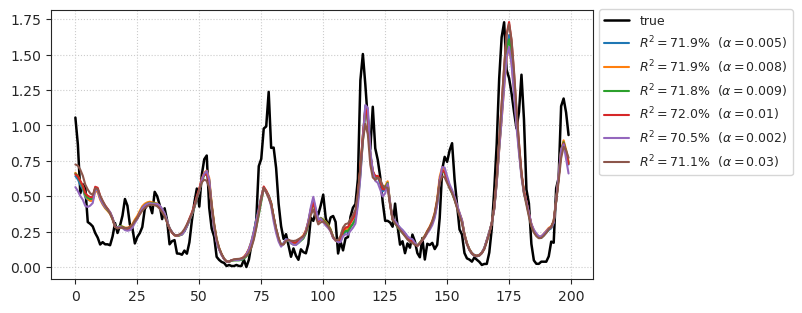

In [258]:
r2_ceil = max_r2(spks_r).item()
r2_ceil

0.9801386925802056

In [257]:
glm.r_tst[0.009] / r2_ceil

0.8753543856783205

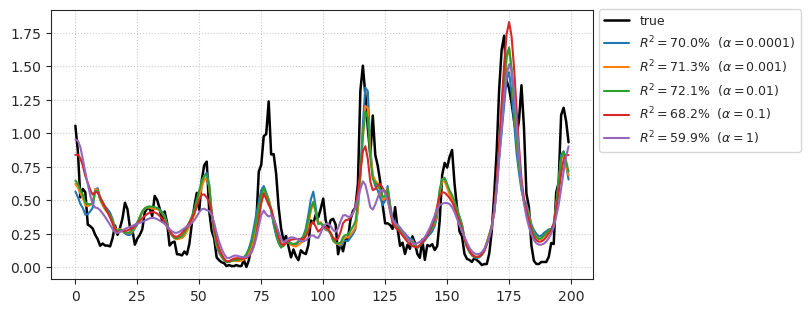

6.072152081688389

In [ ]:
a

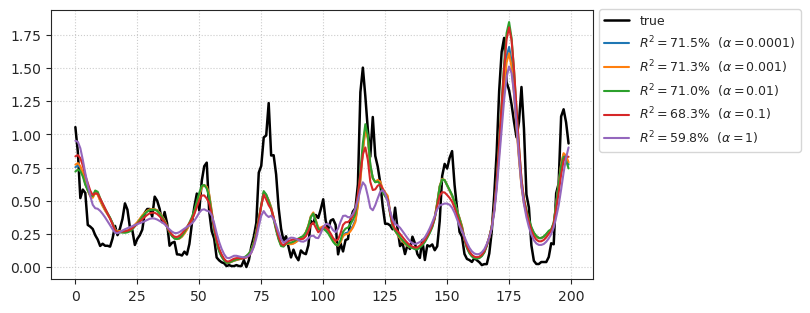

In [186]:
# was with n_iter = 50

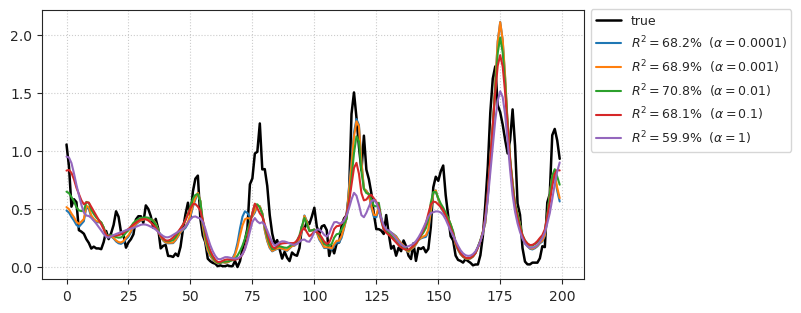

In [184]:
# was with 1000 iters

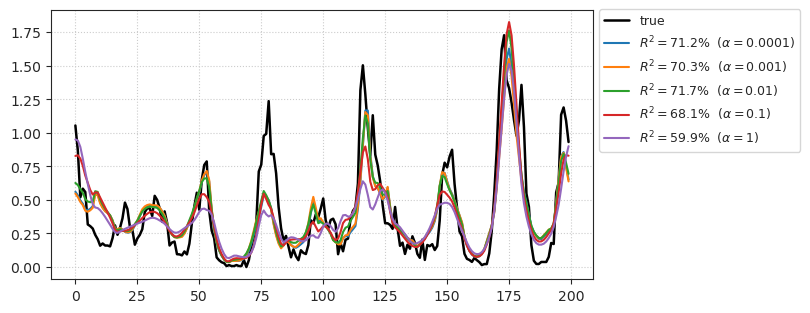

In [170]:
# was with 100 iters

In [178]:
%%time

idxs = good.copy()
idxs = idxs[idxs > best_lag[neuron_i]]

glm_kws = dict(
    category='PoissonRegressor',
    x=x_transformed[idxs - best_lag[0]],
    y=spks[idxs, neuron_i],
    x_tst=x_r_transformed[good_r - best_lag[0]],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[5e-4],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=100)
print(glm.r2_tst)

/home/hadi/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_glm/glm.py:287: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


{0.0005: 71.2381648263946}

CPU times: user 1min 54s, sys: 6.17 s, total: 2min 1s
Wall time: 12.1 s


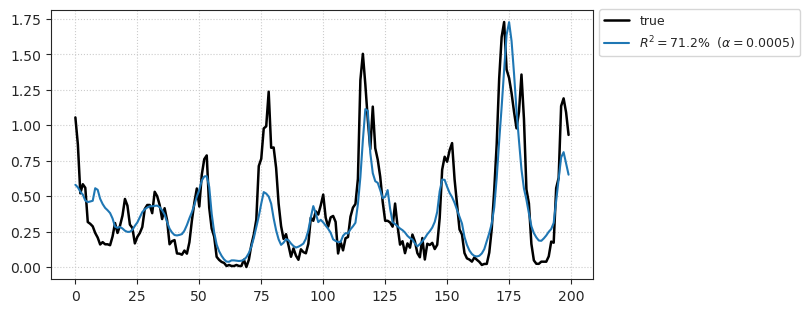

In [179]:
glm.show_pred();

#### PCA with zscoring

In [220]:
mu = x_transformed.mean(0, keepdims=True)
sd = x_transformed.std(0, keepdims=True)

x_transformed_zscored = (x_transformed - mu) / sd
x_r_transformed_zscored = (x_r_transformed - mu) / sd

In [221]:
%%time

idxs = good.copy()
idxs = idxs[idxs > best_lag[neuron_i]]

glm_kws = dict(
    category='PoissonRegressor',
    x=x_transformed_zscored[idxs - best_lag[0]],
    y=spks[idxs, neuron_i],
    x_tst=x_r_transformed_zscored[good_r - best_lag[0]],
    y_tst=np.nanmean(spks_r[neuron_i], 0),
    alphas=[1e-4, 1e-5, 1e-3, 1e-2, 1e-1],
)
glm = LinearModel(**glm_kws).fit(fit_df=False, max_iter=200)
print(glm.r2_tst)

{
    0.0001: 69.36846340134146,
    1e-05: 69.3655630389513,
    0.001: 69.39562119184599,
    0.01: 69.43433929379164,
    0.1: 65.78803857942017
}

CPU times: user 1min 4s, sys: 3.58 s, total: 1min 8s
Wall time: 7.55 s


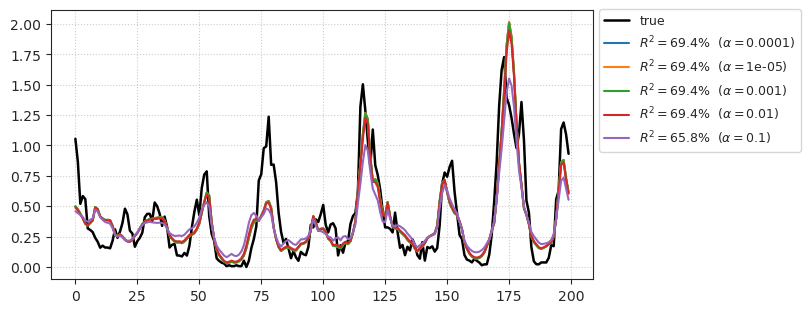

In [222]:
glm.show_pred();

In [223]:
{a: model.n_iter_ for a, model in glm.models.items()}

{0.0001: 11, 1e-05: 11, 0.001: 11, 0.01: 10, 0.1: 7}

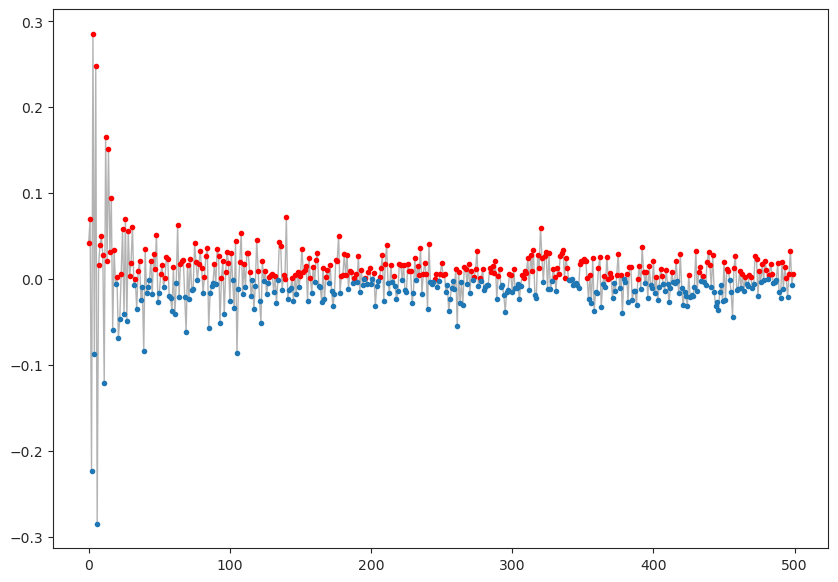

In [224]:
c = glm.models[1e-3].coef_.copy()
c_pos = c.copy()
c_neg = c.copy()
c_pos[c < 0] = np.nan
c_neg[c > 0] = np.nan

fig, ax = create_figure(1, 1, (10, 7))
plt.plot(c, color='dimgrey', lw=1, alpha=0.5)
plt.plot(c_pos, color='r', lw=0, marker='.')
plt.plot(c_neg, color='C0', lw=0, marker='.')